# 6. Decision Trees and Ensemble Learning


This week, we'll talk about decision trees and tree-based ensemble algorithms

## 6.1 Credit risk scoring project

* Dataset: https://github.com/gastonstat/CreditScoring

In this session we'll learn about decision trees and ensemble learning algorithms. The questions that we try to address this week are, "What are decision trees? How are they different from ensemble algorithms? How can we implement and fine-tune these models to make binary classification predictions?"

To be specific, we'll use [credit scoring data](https://github.com/gastonstat/CreditScoring) to build a model that predicts whether a bank should lend loan to a client or not. The bank takes these decisions based on the historical record.

In the credit scoring classification problem,

- if the model returns 0, this means, the client is very likely to payback the loan and the bank will approve the loan.
- if the model returns 1, then the client is considered as a ``defaulter`` and the bank may not approval the loan.

The raw dataset is in the file "CreditScoring.csv" which contains 4455 rows and 14 columns:

 - Status : credit status
 - Seniority : job seniority (years)
 - Home	: type of home ownership
 - Time : time of requested loan
 - Age : client's age
 - Marital : marital status
 - Records : existance of records
 - Job : type of job
 - Expenses : amount of expenses
 - Income : amount of income
 - Assets : amount of assets
 - Debt : amount of debt
 - Amount : amount requested of loan
 - Price : price of good

In [251]:
import pandas as pd
import numpy as np

import seaborn as sns
from matplotlib import pyplot as plt
%matplotlib inline

## 6.2 Data cleaning and preparation

* Downloading the dataset
* Re-encoding the categorical variables
* Doing the train/validation/test split

In this section we clean and prepare the [dataset](https://raw.githubusercontent.com/gastonstat/CreditScoring/master/CreditScoring.csv) for the model which involves the following steps:

- Download the data from the given link.
- Reformat categorical columns (``status``, ``home``, ``marital``, ``records``, and ``job``) by mapping with appropriate values.
- Replace the maximum value of ``income``, ``assests``, and ``debt`` columns with NaNs.
- Replace the NaNs in the dataframe with ``0`` (will be shown in the next lesson).
- Extract only those rows in the column ``status`` who are either ok or default as value.
- Split the data in a two-step process which finally leads to the distribution of 60% train, 20% validation, and 20% test sets with random seed to ``11``.
- Prepare target variable ``status`` by converting it from categorical to binary, where 0 represents ``ok`` and 1 represents ``default``.
- Finally delete the target variable from the train/val/test dataframe.

In [252]:
data = 'https://raw.githubusercontent.com/alexeygrigorev/mlbookcamp-code/master/chapter-06-trees/CreditScoring.csv'

In [253]:
# !wget $data

In [254]:
# !head CreditScoring.csv

In [255]:
df = pd.read_csv(data)
df.head()

,Status,Seniority,Home,Time,Age,Marital,Records,Job,Expenses,Income,Assets,Debt,Amount,Price
0,1,9,1,60,30,2,1,3,73,129,0,0,800,846
1,1,17,1,60,58,3,1,1,48,131,0,0,1000,1658
2,2,10,2,36,46,2,2,3,90,200,3000,0,2000,2985
3,1,0,1,60,24,1,1,1,63,182,2500,0,900,1325
4,1,0,1,36,26,1,1,1,46,107,0,0,310,910


In [256]:
df.columns = df.columns.str.lower()
df.columns

Index(['status', 'seniority', 'home', 'time', 'age', 'marital', 'records',
       'job', 'expenses', 'income', 'assets', 'debt', 'amount', 'price'],
      dtype='object')

In [257]:
df.status.value_counts()

1    3200
2    1254
0       1
Name: status, dtype: int64

In [258]:
status_values = {
    1: 'ok',
    2: 'default',
    0: 'unk'
}

df.status = df.status.map(status_values)

In [259]:
home_values = {
    1: 'rent',
    2: 'owner',
    3: 'private',
    4: 'ignore',
    5: 'parents',
    6: 'other',
    0: 'unk'
}

df.home = df.home.map(home_values)

marital_values = {
    1: 'single',
    2: 'married',
    3: 'widow',
    4: 'separated',
    5: 'divorced',
    0: 'unk'
}

df.marital = df.marital.map(marital_values)

records_values = {
    1: 'no',
    2: 'yes',
    0: 'unk'
}

df.records = df.records.map(records_values)

job_values = {
    1: 'fixed',
    2: 'partime',
    3: 'freelance',
    4: 'others',
    0: 'unk'
}

df.job = df.job.map(job_values)

In [260]:
df.head()

,status,seniority,home,time,age,marital,records,job,expenses,income,assets,debt,amount,price
0,ok,9,rent,60,30,married,no,freelance,73,129,0,0,800,846
1,ok,17,rent,60,58,widow,no,fixed,48,131,0,0,1000,1658
2,default,10,owner,36,46,married,yes,freelance,90,200,3000,0,2000,2985
3,ok,0,rent,60,24,single,no,fixed,63,182,2500,0,900,1325
4,ok,0,rent,36,26,single,no,fixed,46,107,0,0,310,910


In [261]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4455 entries, 0 to 4454
Data columns (total 14 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   status     4455 non-null   object
 1   seniority  4455 non-null   int64 
 2   home       4455 non-null   object
 3   time       4455 non-null   int64 
 4   age        4455 non-null   int64 
 5   marital    4455 non-null   object
 6   records    4455 non-null   object
 7   job        4455 non-null   object
 8   expenses   4455 non-null   int64 
 9   income     4455 non-null   int64 
 10  assets     4455 non-null   int64 
 11  debt       4455 non-null   int64 
 12  amount     4455 non-null   int64 
 13  price      4455 non-null   int64 
dtypes: int64(9), object(5)
memory usage: 487.4+ KB


In [262]:
df.describe().round()

,seniority,time,age,expenses,income,assets,debt,amount,price
count,4455.0,4455.0,4455.0,4455.0,4455.0,4455.0,4455.0,4455.0,4455.0
mean,8.0,46.0,37.0,56.0,763317.0,1060341.0,404382.0,1039.0,1463.0
std,8.0,15.0,11.0,20.0,8703625.0,10217569.0,6344253.0,475.0,628.0
min,0.0,6.0,18.0,35.0,0.0,0.0,0.0,100.0,105.0
25%,2.0,36.0,28.0,35.0,80.0,0.0,0.0,700.0,1118.0
50%,5.0,48.0,36.0,51.0,120.0,3500.0,0.0,1000.0,1400.0
75%,12.0,60.0,45.0,72.0,166.0,6000.0,0.0,1300.0,1692.0
max,48.0,72.0,68.0,180.0,99999999.0,99999999.0,99999999.0,5000.0,11140.0


In [263]:
for c in ['income', 'assets', 'debt']:
    df[c] = df[c].replace(to_replace=99999999, value=np.nan)

In [264]:
df.describe().round()

,seniority,time,age,expenses,income,assets,debt,amount,price
count,4455.0,4455.0,4455.0,4455.0,4421.0,4408.0,4437.0,4455.0,4455.0
mean,8.0,46.0,37.0,56.0,131.0,5403.0,343.0,1039.0,1463.0
std,8.0,15.0,11.0,20.0,86.0,11573.0,1246.0,475.0,628.0
min,0.0,6.0,18.0,35.0,0.0,0.0,0.0,100.0,105.0
25%,2.0,36.0,28.0,35.0,80.0,0.0,0.0,700.0,1118.0
50%,5.0,48.0,36.0,51.0,120.0,3000.0,0.0,1000.0,1400.0
75%,12.0,60.0,45.0,72.0,165.0,6000.0,0.0,1300.0,1692.0
max,48.0,72.0,68.0,180.0,959.0,300000.0,30000.0,5000.0,11140.0


In [265]:
df.describe(include="object")

,status,home,marital,records,job
count,4455,4455,4455,4455,4455
unique,3,7,6,2,5
top,ok,owner,married,no,fixed
freq,3200,2107,3241,3682,2806


In [266]:
df.status.value_counts()  # unk = unknown

ok         3200
default    1254
unk           1
Name: status, dtype: int64

In [267]:
df = df[df.status != 'unk'].reset_index(drop=True)

In [268]:
# df.isnull().sum()

In [269]:
# df.duplicated().sum()

In [270]:
from sklearn.model_selection import train_test_split

df_full_train, df_test = train_test_split(df, test_size=0.2, random_state=11)
df_train, df_val = train_test_split(df_full_train, test_size=0.25, random_state=11)

In [271]:
df_train = df_train.reset_index(drop=True)
df_val = df_val.reset_index(drop=True)
df_test = df_test.reset_index(drop=True)

In [272]:
# df_train.status

In [273]:
# (df_train.status == 'default').astype('int').values

In [274]:
y_train = (df_train.status == 'default').astype('int').values
y_val = (df_val.status == 'default').astype('int').values
y_test = (df_test.status == 'default').astype('int').values

In [275]:
del df_train['status']
del df_val['status']
del df_test['status']

In [276]:
df_train

,seniority,home,time,age,marital,records,job,expenses,income,assets,debt,amount,price
0,10,owner,36,36,married,no,freelance,75,0.0,10000.0,0.0,1000,1400
1,6,parents,48,32,single,yes,fixed,35,85.0,0.0,0.0,1100,1330
2,1,parents,48,40,married,no,fixed,75,121.0,0.0,0.0,1320,1600
3,1,parents,48,23,single,no,partime,35,72.0,0.0,0.0,1078,1079
4,5,owner,36,46,married,no,freelance,60,100.0,4000.0,0.0,1100,1897
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2667,18,private,36,45,married,no,fixed,45,220.0,20000.0,0.0,800,1600
2668,7,private,60,29,married,no,fixed,60,51.0,3500.0,500.0,1000,1290
2669,1,parents,24,19,single,no,fixed,35,28.0,0.0,0.0,400,600
2670,15,owner,48,43,married,no,freelance,60,100.0,18000.0,0.0,2500,2976


## 6.3 Decision trees

* How a decision tree looks like
* Training a decision tree 
* Overfitting
* Controlling the size of a tree

Decision Trees are powerful algorithms, capable of fitting complex datasets. The decision trees make predictions based on the bunch of if/else statements by splitting a node into two or more sub-nodes.

With versatility, the decision tree is also prone to overfitting. One of the reason why this algorithm often overfits because of its depth. It tends to memorize all the patterns in the train data but struggle to performs well on the unseen data (validation or test set).

To overcome with overfitting problem, we can reduce the complexity of the algorithm by reducing the depth size.

The decision tree with only a single depth is called decision stump and it only has one split from the root.

**Classes, functions, and methods:**

- ``DecisionTreeClassifier``: classification model from ``sklearn.tree`` class.
- ``max_depth``: hyperparameter to control the depth of decision tree algorithm.
- ``export_text``: method from ``sklearn.tree`` class to display the text report showing the rules of a decision tree.

*Note*: we have already covered ``DictVectorizer`` in session 3 and ``roc_auc_score`` in session 4 respectively.

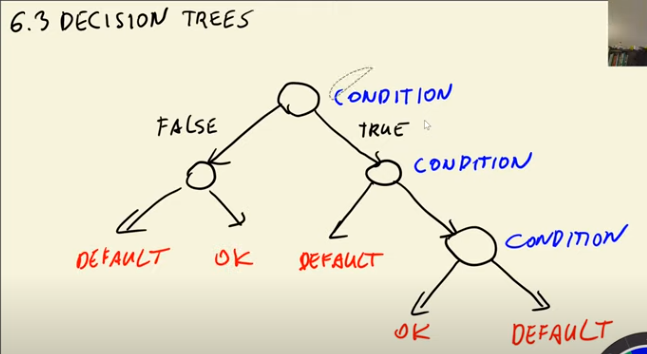

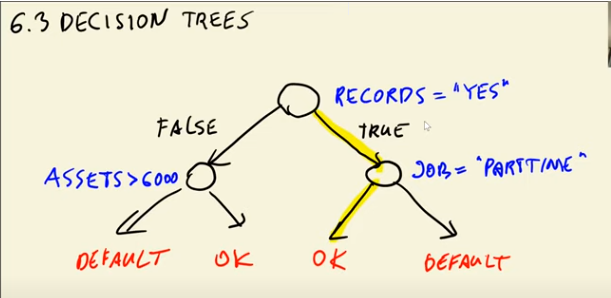

In [277]:
def assess_risk(client):
    if client['records'] == 'yes':
        if client['job'] == 'parttime':
            return 'default'
        else:
            return 'ok'
    else:
        if client['assets'] > 6000:
            return 'ok'
        else:
            return 'default'

In [278]:
xi = df_train.iloc[0].to_dict()
xi

{'seniority': 10,
 'home': 'owner',
 'time': 36,
 'age': 36,
 'marital': 'married',
 'records': 'no',
 'job': 'freelance',
 'expenses': 75,
 'income': 0.0,
 'assets': 10000.0,
 'debt': 0.0,
 'amount': 1000,
 'price': 1400}

In [279]:
assess_risk(xi)

'ok'

In [280]:
from sklearn.tree import DecisionTreeClassifier # algorithm
from sklearn.feature_extraction import DictVectorizer # encoding
from sklearn.metrics import roc_auc_score # evaluation
from sklearn.tree import export_text

In [281]:
train_dicts = df_train.fillna(0).to_dict(orient='records')
train_dicts

[{'seniority': 10,
  'home': 'owner',
  'time': 36,
  'age': 36,
  'marital': 'married',
  'records': 'no',
  'job': 'freelance',
  'expenses': 75,
  'income': 0.0,
  'assets': 10000.0,
  'debt': 0.0,
  'amount': 1000,
  'price': 1400},
 {'seniority': 6,
  'home': 'parents',
  'time': 48,
  'age': 32,
  'marital': 'single',
  'records': 'yes',
  'job': 'fixed',
  'expenses': 35,
  'income': 85.0,
  'assets': 0.0,
  'debt': 0.0,
  'amount': 1100,
  'price': 1330},
 {'seniority': 1,
  'home': 'parents',
  'time': 48,
  'age': 40,
  'marital': 'married',
  'records': 'no',
  'job': 'fixed',
  'expenses': 75,
  'income': 121.0,
  'assets': 0.0,
  'debt': 0.0,
  'amount': 1320,
  'price': 1600},
 {'seniority': 1,
  'home': 'parents',
  'time': 48,
  'age': 23,
  'marital': 'single',
  'records': 'no',
  'job': 'partime',
  'expenses': 35,
  'income': 72.0,
  'assets': 0.0,
  'debt': 0.0,
  'amount': 1078,
  'price': 1079},
 {'seniority': 5,
  'home': 'owner',
  'time': 36,
  'age': 46,
  'm

In [282]:
# Encoding

dv = DictVectorizer(sparse=False)
X_train = dv.fit_transform(train_dicts)
X_train

array([[3.60e+01, 1.00e+03, 1.00e+04, ..., 0.00e+00, 1.00e+01, 3.60e+01],
       [3.20e+01, 1.10e+03, 0.00e+00, ..., 1.00e+00, 6.00e+00, 4.80e+01],
       [4.00e+01, 1.32e+03, 0.00e+00, ..., 0.00e+00, 1.00e+00, 4.80e+01],
       ...,
       [1.90e+01, 4.00e+02, 0.00e+00, ..., 0.00e+00, 1.00e+00, 2.40e+01],
       [4.30e+01, 2.50e+03, 1.80e+04, ..., 0.00e+00, 1.50e+01, 4.80e+01],
       [2.70e+01, 4.50e+02, 5.00e+03, ..., 1.00e+00, 1.20e+01, 4.80e+01]])

In [283]:
# Training

dt = DecisionTreeClassifier()  # max_depth = None
dt.fit(X_train, y_train)

DecisionTreeClassifier()

In [284]:
val_dicts = df_val.fillna(0).to_dict(orient='records')
X_val = dv.transform(val_dicts)
X_val

array([[3.10e+01, 5.50e+02, 0.00e+00, ..., 0.00e+00, 6.00e+00, 3.60e+01],
       [3.80e+01, 1.00e+03, 0.00e+00, ..., 0.00e+00, 1.80e+01, 6.00e+01],
       [4.00e+01, 7.00e+02, 0.00e+00, ..., 1.00e+00, 1.70e+01, 2.40e+01],
       ...,
       [3.60e+01, 3.90e+03, 2.90e+04, ..., 1.00e+00, 2.00e+00, 6.00e+01],
       [2.50e+01, 3.00e+02, 0.00e+00, ..., 1.00e+00, 3.00e+00, 2.40e+01],
       [3.20e+01, 1.55e+03, 6.00e+03, ..., 0.00e+00, 1.50e+01, 6.00e+01]])

In [285]:
y_pred = dt.predict_proba(X_val)[:, 1]
# print(y_pred[:10])
roc_auc_score(y_val, y_pred)
# print(roc_auc_score(y_val, y_pred))

0.6572285728124773

In [286]:
y_pred = dt.predict_proba(X_train)[:, 1]
# print(y_pred[:10])
roc_auc_score(y_train, y_pred)
# print(roc_auc_score(y_train, y_pred))

1.0

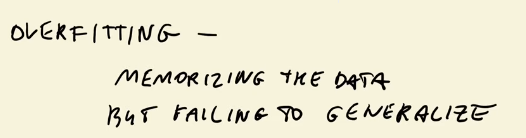

In [287]:
dt = DecisionTreeClassifier(max_depth=2)  # max_depth = 2
dt.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=2)

In [288]:
y_pred = dt.predict_proba(X_train)[:, 1]
auc = roc_auc_score(y_train, y_pred)
print('train:', auc)

y_pred = dt.predict_proba(X_val)[:, 1]
auc = roc_auc_score(y_val, y_pred)
print('val:', auc)

train: 0.7054989859726213
val: 0.6685264343319367


In [289]:
# dt = DecisionTreeClassifier(max_depth=3)  # max_depth = 3
# dt.fit(X_train, y_train)

In [290]:
# y_pred = dt.predict_proba(X_train)[:, 1]
# auc = roc_auc_score(y_train, y_pred)
# print('train:', auc)

# y_pred = dt.predict_proba(X_val)[:, 1]
# auc = roc_auc_score(y_val, y_pred)
# print('val:', auc)

In [291]:
print(export_text(dt))

|--- feature_26 <= 0.50
|   |--- feature_16 <= 0.50
|   |   |--- class: 0
|   |--- feature_16 >  0.50
|   |   |--- class: 1
|--- feature_26 >  0.50
|   |--- feature_27 <= 6.50
|   |   |--- class: 1
|   |--- feature_27 >  6.50
|   |   |--- class: 0



In [292]:
print(export_text(dt, feature_names=list(dv.get_feature_names_out())))

|--- records=yes <= 0.50
|   |--- job=partime <= 0.50
|   |   |--- class: 0
|   |--- job=partime >  0.50
|   |   |--- class: 1
|--- records=yes >  0.50
|   |--- seniority <= 6.50
|   |   |--- class: 1
|   |--- seniority >  6.50
|   |   |--- class: 0



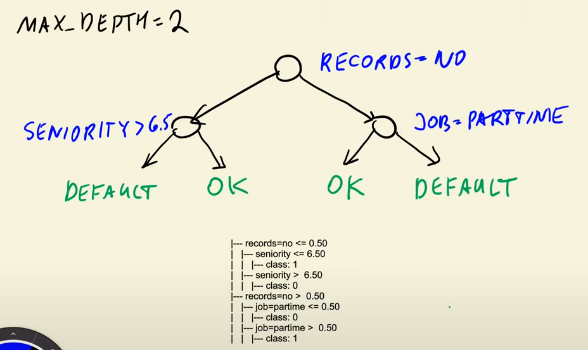

## 6.4 Decision tree learning algorithm

* Finding the best split for one column
* Finding the best split for the entire dataset
* Stopping criteria
* Decision tree learning algorithm

This lesson first reviews the topics learned in previous lesson about training a decision tress using sklearn, how to handle the model not generalizing due to overfitting of the data.

In this lesson, we learn about how to best split a decision tree and different classification criteria that can be used to split a tree. We dive deep using an example and splitting the tree using ``misclassification`` criteria. Additionally, different stopping criteria to break the iterative tree split criteria are discussed.

- structure of a decision tree: nodes & leaves
- depth of a decision tree & levels
- rules & conditions, thresholds
- misclassification rate
- impurity criteria (i.e. MSE)
- decision trees can be used to solve regression problems

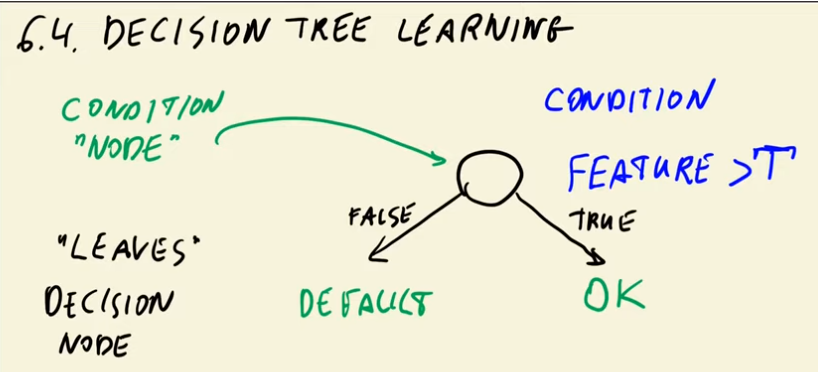

In [293]:
data = [
    [8000, 'default'],
    [2000, 'default'],
    [   0, 'default'],
    [5000, 'ok'],
    [5000, 'ok'],
    [4000, 'ok'],
    [9000, 'ok'],
    [3000, 'default'],
]

df_example = pd.DataFrame(data, columns=['assets', 'status'])
df_example

,assets,status
0,8000,default
1,2000,default
2,0,default
3,5000,ok
4,5000,ok
5,4000,ok
6,9000,ok
7,3000,default


In [294]:
df_example.sort_values('assets')

,assets,status
2,0,default
1,2000,default
7,3000,default
5,4000,ok
3,5000,ok
4,5000,ok
0,8000,default
6,9000,ok


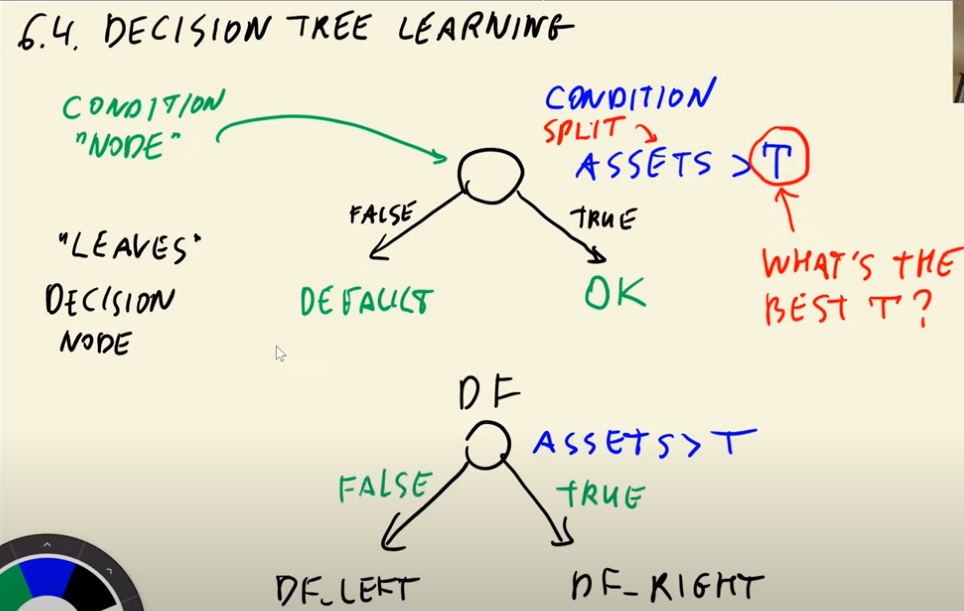

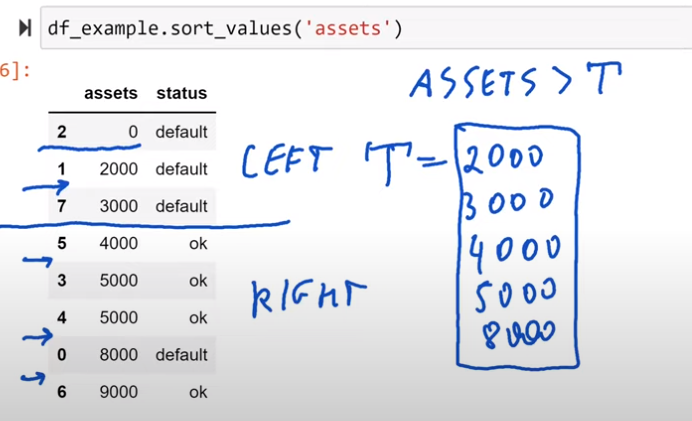

In [295]:
Ts = [0, 2000, 3000, 4000, 5000, 8000] # potential thresholds

In [296]:
T = 4000
df_left = df_example[df_example.assets <= T]
df_right = df_example[df_example.assets > T]

display(df_left)
# print(df_left.status.value_counts())
print(df_left.status.value_counts(normalize=True))
display(df_right)
# print(df_left.status.value_counts())
print(df_left.status.value_counts(normalize=True))

,assets,status
1,2000,default
2,0,default
5,4000,ok
7,3000,default


default    0.75
ok         0.25
Name: status, dtype: float64


,assets,status
0,8000,default
3,5000,ok
4,5000,ok
6,9000,ok


default    0.75
ok         0.25
Name: status, dtype: float64


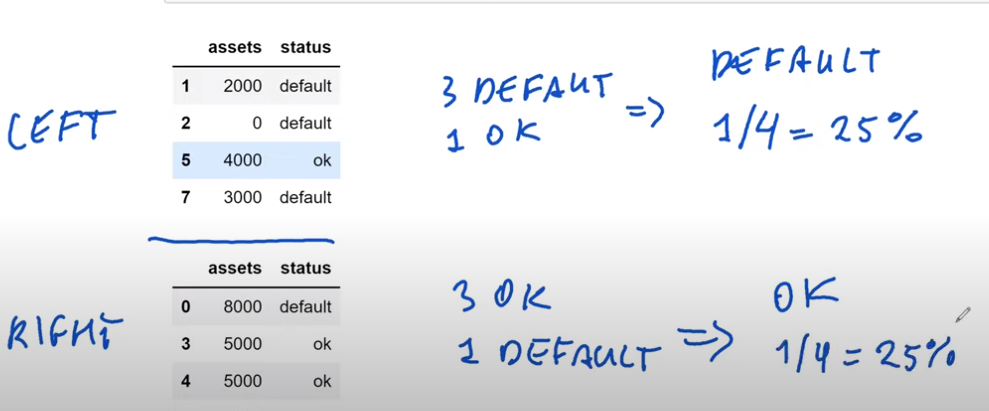

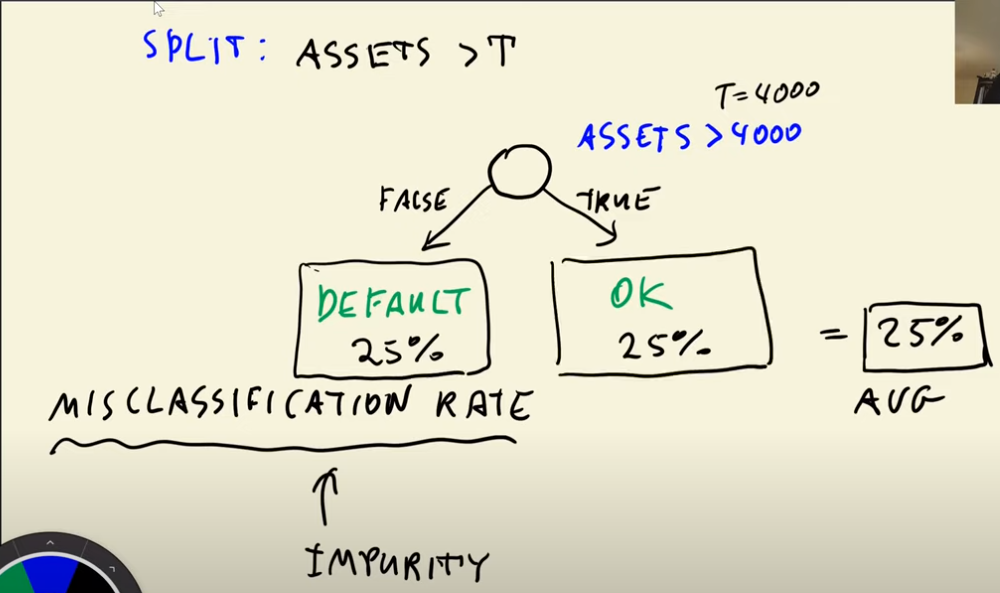

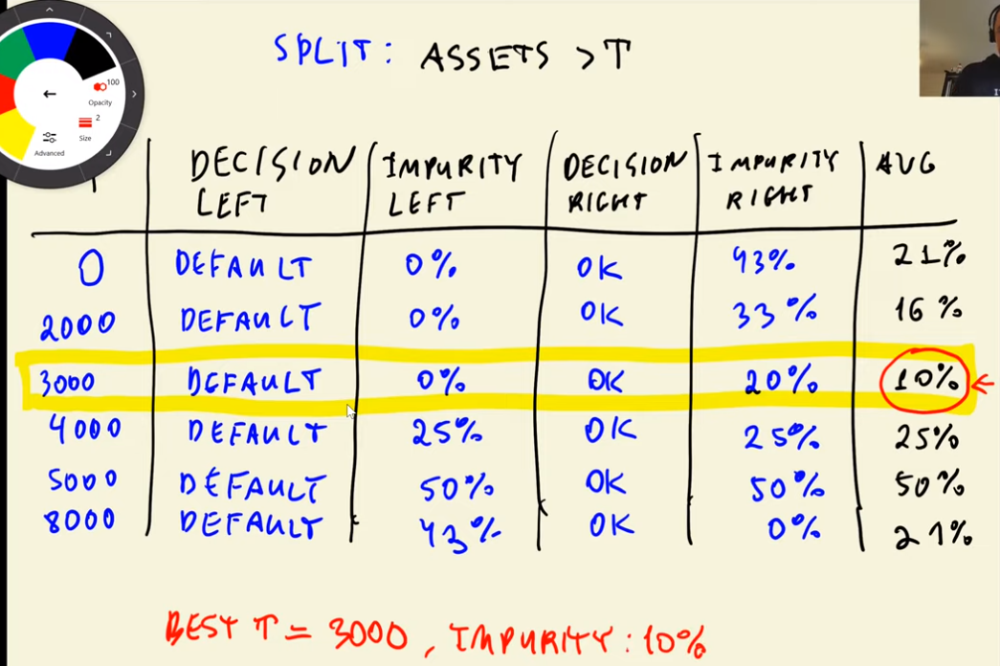

In [297]:
from IPython.display import display

In [298]:
for T in Ts:
    print('Threshold :', T)
    df_left = df_example[df_example.assets <= T]
    df_right = df_example[df_example.assets > T]
    
    display(df_left)
    print(df_left.status.value_counts(normalize=True))
    display(df_right)
    print(df_right.status.value_counts(normalize=True))

    print()

Threshold : 0


,assets,status
2,0,default


default    1.0
Name: status, dtype: float64


,assets,status
0,8000,default
1,2000,default
3,5000,ok
4,5000,ok
5,4000,ok
6,9000,ok
7,3000,default


ok         0.571429
default    0.428571
Name: status, dtype: float64

Threshold : 2000


,assets,status
1,2000,default
2,0,default


default    1.0
Name: status, dtype: float64


,assets,status
0,8000,default
3,5000,ok
4,5000,ok
5,4000,ok
6,9000,ok
7,3000,default


ok         0.666667
default    0.333333
Name: status, dtype: float64

Threshold : 3000


,assets,status
1,2000,default
2,0,default
7,3000,default


default    1.0
Name: status, dtype: float64


,assets,status
0,8000,default
3,5000,ok
4,5000,ok
5,4000,ok
6,9000,ok


ok         0.8
default    0.2
Name: status, dtype: float64

Threshold : 4000


,assets,status
1,2000,default
2,0,default
5,4000,ok
7,3000,default


default    0.75
ok         0.25
Name: status, dtype: float64


,assets,status
0,8000,default
3,5000,ok
4,5000,ok
6,9000,ok


ok         0.75
default    0.25
Name: status, dtype: float64

Threshold : 5000


,assets,status
1,2000,default
2,0,default
3,5000,ok
4,5000,ok
5,4000,ok
7,3000,default


default    0.5
ok         0.5
Name: status, dtype: float64


,assets,status
0,8000,default
6,9000,ok


default    0.5
ok         0.5
Name: status, dtype: float64

Threshold : 8000


,assets,status
0,8000,default
1,2000,default
2,0,default
3,5000,ok
4,5000,ok
5,4000,ok
7,3000,default


default    0.571429
ok         0.428571
Name: status, dtype: float64


,assets,status
6,9000,ok


ok    1.0
Name: status, dtype: float64



In [299]:
data = [
    [8000, 3000, 'default'],
    [2000, 1000, 'default'],
    [   0, 1000, 'default'],
    [5000, 1000, 'ok'],
    [5000, 1000, 'ok'],
    [4000, 1000, 'ok'],
    [9000,  500, 'ok'],
    [3000, 2000, 'default'],
]

df_example = pd.DataFrame(data, columns=['assets', 'debt', 'status'])
df_example

,assets,debt,status
0,8000,3000,default
1,2000,1000,default
2,0,1000,default
3,5000,1000,ok
4,5000,1000,ok
5,4000,1000,ok
6,9000,500,ok
7,3000,2000,default


In [300]:
df_example.sort_values('debt')

,assets,debt,status
6,9000,500,ok
1,2000,1000,default
2,0,1000,default
3,5000,1000,ok
4,5000,1000,ok
5,4000,1000,ok
7,3000,2000,default
0,8000,3000,default


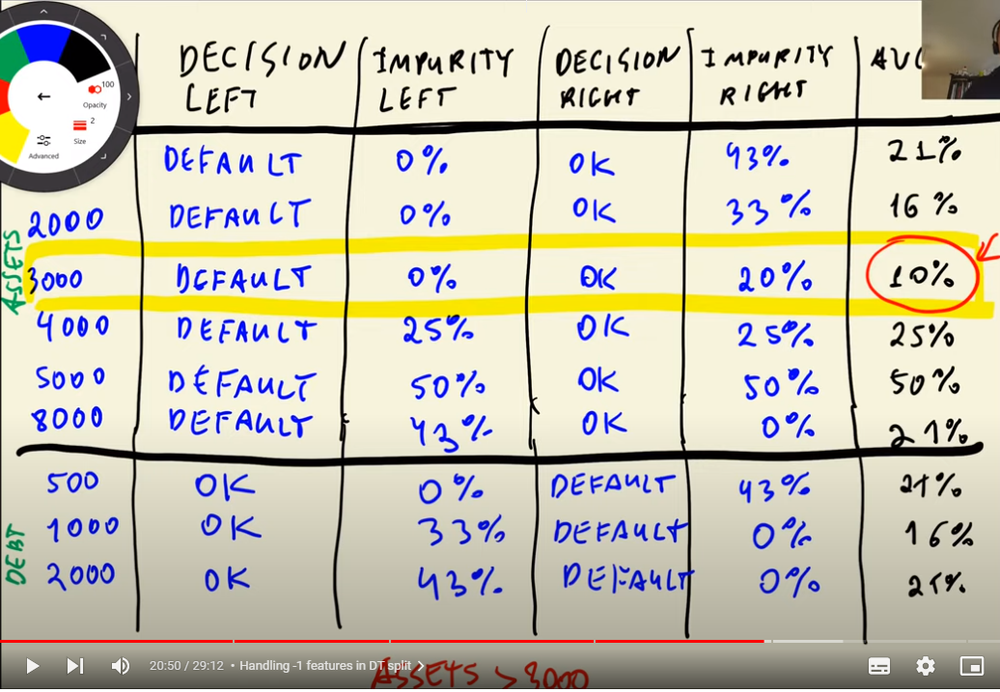

In [301]:
thresholds = {
    'assets': [0, 2000, 3000, 4000, 5000, 8000],
    'debt': [500, 1000, 2000]
}

In [302]:
for feature, Ts in thresholds.items():
    print('#####################')
    print(feature)
    for T in Ts:
        print('Threshold :', T)
        df_left = df_example[df_example[feature] <= T]
        df_right = df_example[df_example[feature] > T]

        display(df_left)
        print(df_left.status.value_counts(normalize=True))
        display(df_right)
        print(df_right.status.value_counts(normalize=True))

        print()
    print('#####################')

#####################
assets
Threshold : 0


,assets,debt,status
2,0,1000,default


default    1.0
Name: status, dtype: float64


,assets,debt,status
0,8000,3000,default
1,2000,1000,default
3,5000,1000,ok
4,5000,1000,ok
5,4000,1000,ok
6,9000,500,ok
7,3000,2000,default


ok         0.571429
default    0.428571
Name: status, dtype: float64

Threshold : 2000


,assets,debt,status
1,2000,1000,default
2,0,1000,default


default    1.0
Name: status, dtype: float64


,assets,debt,status
0,8000,3000,default
3,5000,1000,ok
4,5000,1000,ok
5,4000,1000,ok
6,9000,500,ok
7,3000,2000,default


ok         0.666667
default    0.333333
Name: status, dtype: float64

Threshold : 3000


,assets,debt,status
1,2000,1000,default
2,0,1000,default
7,3000,2000,default


default    1.0
Name: status, dtype: float64


,assets,debt,status
0,8000,3000,default
3,5000,1000,ok
4,5000,1000,ok
5,4000,1000,ok
6,9000,500,ok


ok         0.8
default    0.2
Name: status, dtype: float64

Threshold : 4000


,assets,debt,status
1,2000,1000,default
2,0,1000,default
5,4000,1000,ok
7,3000,2000,default


default    0.75
ok         0.25
Name: status, dtype: float64


,assets,debt,status
0,8000,3000,default
3,5000,1000,ok
4,5000,1000,ok
6,9000,500,ok


ok         0.75
default    0.25
Name: status, dtype: float64

Threshold : 5000


,assets,debt,status
1,2000,1000,default
2,0,1000,default
3,5000,1000,ok
4,5000,1000,ok
5,4000,1000,ok
7,3000,2000,default


default    0.5
ok         0.5
Name: status, dtype: float64


,assets,debt,status
0,8000,3000,default
6,9000,500,ok


default    0.5
ok         0.5
Name: status, dtype: float64

Threshold : 8000


,assets,debt,status
0,8000,3000,default
1,2000,1000,default
2,0,1000,default
3,5000,1000,ok
4,5000,1000,ok
5,4000,1000,ok
7,3000,2000,default


default    0.571429
ok         0.428571
Name: status, dtype: float64


,assets,debt,status
6,9000,500,ok


ok    1.0
Name: status, dtype: float64

#####################
#####################
debt
Threshold : 500


,assets,debt,status
6,9000,500,ok


ok    1.0
Name: status, dtype: float64


,assets,debt,status
0,8000,3000,default
1,2000,1000,default
2,0,1000,default
3,5000,1000,ok
4,5000,1000,ok
5,4000,1000,ok
7,3000,2000,default


default    0.571429
ok         0.428571
Name: status, dtype: float64

Threshold : 1000


,assets,debt,status
1,2000,1000,default
2,0,1000,default
3,5000,1000,ok
4,5000,1000,ok
5,4000,1000,ok
6,9000,500,ok


ok         0.666667
default    0.333333
Name: status, dtype: float64


,assets,debt,status
0,8000,3000,default
7,3000,2000,default


default    1.0
Name: status, dtype: float64

Threshold : 2000


,assets,debt,status
1,2000,1000,default
2,0,1000,default
3,5000,1000,ok
4,5000,1000,ok
5,4000,1000,ok
6,9000,500,ok
7,3000,2000,default


ok         0.571429
default    0.428571
Name: status, dtype: float64


,assets,debt,status
0,8000,3000,default


default    1.0
Name: status, dtype: float64

#####################


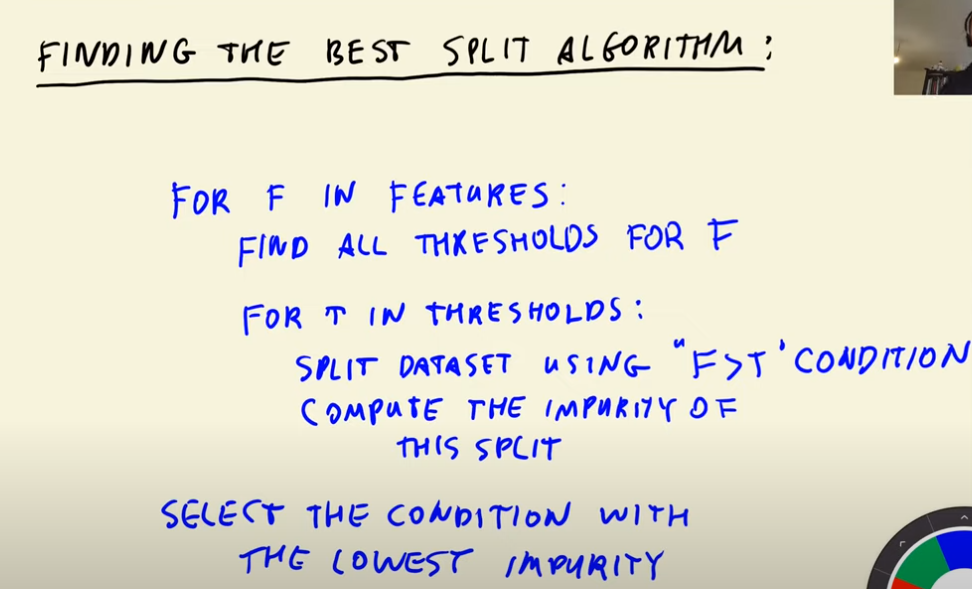

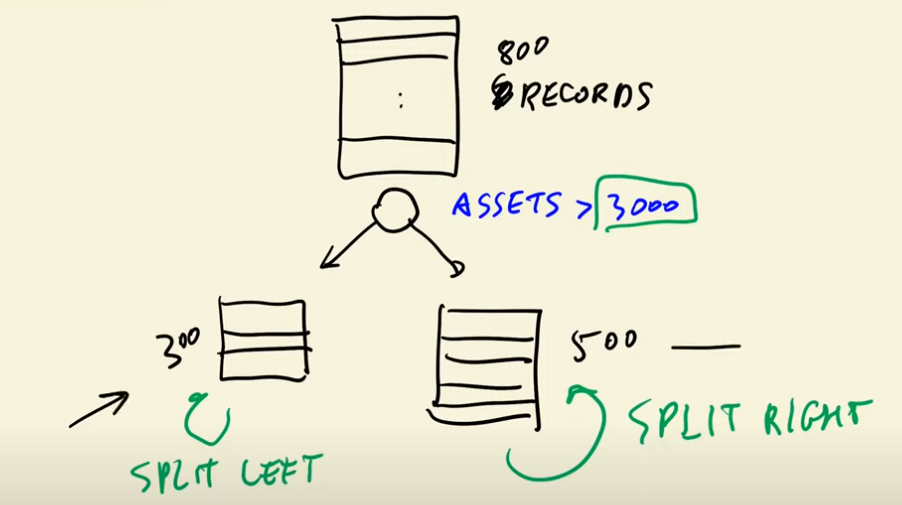

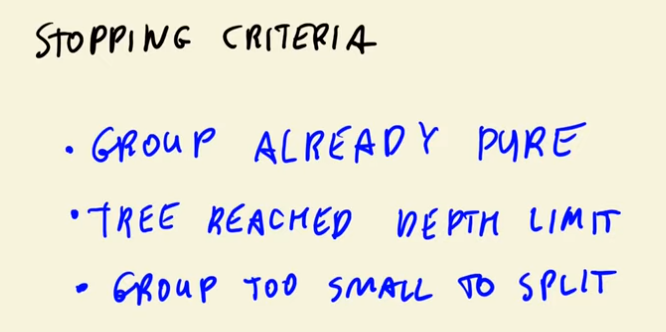

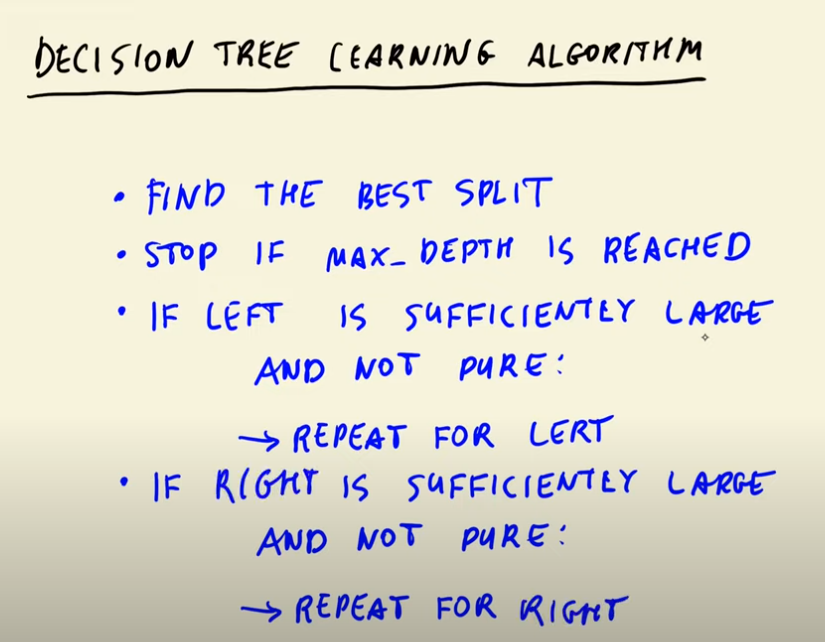

## 6.5 Decision trees parameter tuning

* selecting `max_depth`
* selecting `min_samples_leaf`

In this lesson, we will discuss about different parameters present to control a Decision Tree (DT). Two features, ``max_depth`` and ``min_samples_leaf`` have a greater importance than other parameters. We will further see how we first tune ``max_depth`` parameter and then move to tuning other parameters will help. Finally, a dataframe is created with all possible combinations of ``max_depth``, ``min_sample_leaf`` and the auc score corresponding to them. These results are visualized using a heatmap by pivoting the dataframe to easily determine the best possible ``max_depth`` and ``min_samples_leaf`` combination. Finally, the DT is retrained using the identified parameter combination. DT so trained is viewed as a tree diagram.

- iterating to find optimal parameter settings
- creating the heatmap with seaborn

In [303]:
depths = [1, 2, 3, 4, 5, 6, 10, 15, 20, None]

for depth in depths: 
    dt = DecisionTreeClassifier(max_depth=depth)
    dt.fit(X_train, y_train)
    
    y_pred = dt.predict_proba(X_val)[:, 1]
    auc = roc_auc_score(y_val, y_pred)
    
    print('%4s -> %.3f' % (depth, auc))

   1 -> 0.606
   2 -> 0.669
   3 -> 0.739
   4 -> 0.761
   5 -> 0.767
   6 -> 0.745
  10 -> 0.697
  15 -> 0.663
  20 -> 0.651
None -> 0.656


In [304]:
scores = []

for depth in [4, 5, 6]:
    for s in [1, 5, 10, 15, 20, 500, 100, 200]:
        dt = DecisionTreeClassifier(max_depth=depth, min_samples_leaf=s)
        dt.fit(X_train, y_train)

        y_pred = dt.predict_proba(X_val)[:, 1]
        auc = roc_auc_score(y_val, y_pred)
        
        scores.append((depth, s, auc))

In [305]:
columns = ['max_depth', 'min_samples_leaf', 'auc']
df_scores = pd.DataFrame(scores, columns=columns)

In [306]:
df_scores.sort_values(by='auc', ascending=False).head()

,max_depth,min_samples_leaf,auc
19,6,15,0.785474
18,6,10,0.777521
22,6,100,0.776434
20,6,20,0.773982
12,5,20,0.773537


In [307]:
df_scores_pivot = df_scores.pivot(index='min_samples_leaf', columns=['max_depth'], values=['auc'])
df_scores_pivot.round(3)

auc              
max_depth             4      5      6
min_samples_leaf                     
1                 0.761  0.766  0.759
5                 0.761  0.768  0.759
10                0.761  0.762  0.778
15                0.764  0.773  0.785
20                0.761  0.774  0.774
100               0.756  0.763  0.776
200               0.747  0.759  0.768
500               0.680  0.680  0.680

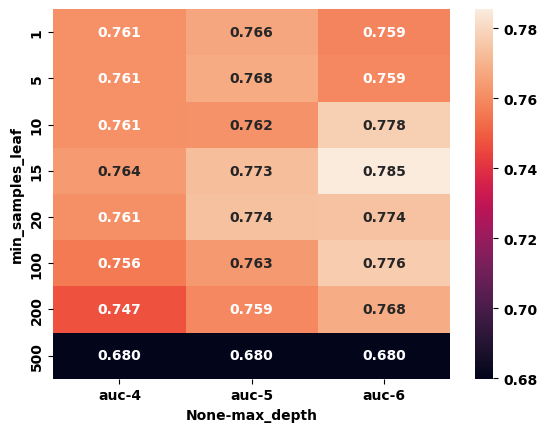

In [308]:
sns.heatmap(df_scores_pivot, annot=True, fmt=".3f");

In [309]:
dt = DecisionTreeClassifier(max_depth=6, min_samples_leaf=15)
dt.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=6, min_samples_leaf=15)

In [310]:
print(export_text(dt, feature_names=list(dv.get_feature_names_out())))

|--- records=yes <= 0.50
|   |--- job=partime <= 0.50
|   |   |--- income <= 74.50
|   |   |   |--- assets <= 4250.00
|   |   |   |   |--- income <= 20.00
|   |   |   |   |   |--- seniority <= 1.50
|   |   |   |   |   |   |--- class: 1
|   |   |   |   |   |--- seniority >  1.50
|   |   |   |   |   |   |--- class: 1
|   |   |   |   |--- income >  20.00
|   |   |   |   |   |--- expenses <= 71.00
|   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |--- expenses >  71.00
|   |   |   |   |   |   |--- class: 1
|   |   |   |--- assets >  4250.00
|   |   |   |   |--- debt <= 1600.00
|   |   |   |   |   |--- seniority <= 2.50
|   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |--- seniority >  2.50
|   |   |   |   |   |   |--- class: 0
|   |   |   |   |--- debt >  1600.00
|   |   |   |   |   |--- class: 1
|   |   |--- income >  74.50
|   |   |   |--- seniority <= 5.50
|   |   |   |   |--- amount <= 1330.00
|   |   |   |   |   |--- assets <= 3326.00
|   |   |   |   |   |   |--- clas

In [311]:
from sklearn.tree import plot_tree

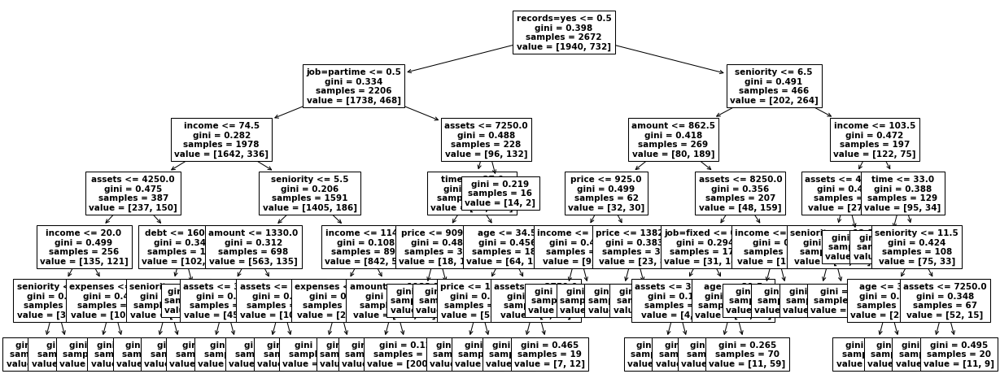

In [312]:
plt.figure(figsize=(20,8), dpi=75)
plot_tree(dt, feature_names=list(dv.get_feature_names_out()), fontsize=10);

In [313]:
scores = []

for depth in [4, 5, 6, 7, 10, 15, 20]:
    for s in [1, 2, 5, 10, 15, 20, 50, 100, 200, 500]:
        dt = DecisionTreeClassifier(max_depth=depth, min_samples_leaf=s)
        dt.fit(X_train, y_train)

        y_pred = dt.predict_proba(X_val)[:, 1]
        auc = roc_auc_score(y_val, y_pred)
        
        scores.append((depth, s, auc))

In [314]:
columns = ['max_depth', 'min_samples_leaf', 'auc']
df_scores = pd.DataFrame(scores, columns=columns)

In [315]:
df_scores_pivot = df_scores.pivot(index='min_samples_leaf', columns=['max_depth'], values=['auc'])
df_scores_pivot.round(3)

auc                                          
max_depth            4      5      6      7      10     15     20
min_samples_leaf                                                 
1                 0.761  0.766  0.753  0.742  0.679  0.665  0.648
2                 0.761  0.767  0.753  0.760  0.706  0.697  0.682
5                 0.761  0.768  0.762  0.758  0.726  0.719  0.713
10                0.761  0.762  0.778  0.764  0.767  0.760  0.761
15                0.764  0.772  0.785  0.780  0.792  0.788  0.788
20                0.761  0.774  0.774  0.780  0.783  0.784  0.784
50                0.753  0.768  0.772  0.777  0.778  0.778  0.776
100               0.756  0.763  0.776  0.780  0.780  0.780  0.780
200               0.747  0.759  0.768  0.768  0.768  0.768  0.768
500               0.680  0.680  0.680  0.680  0.680  0.680  0.680

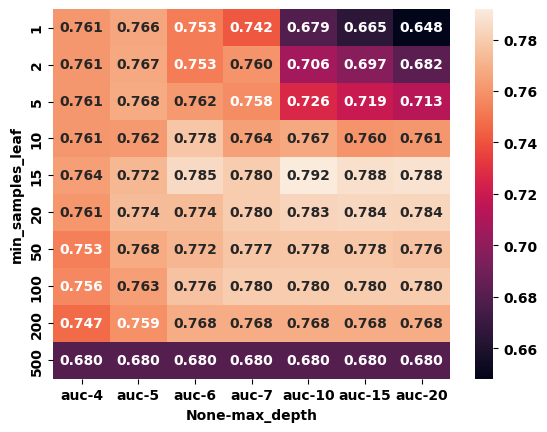

In [316]:
sns.heatmap(df_scores_pivot, annot=True, fmt=".3f");

## 6.6 Ensembles and random forest

* Board of experts
* Ensembling models 
* Random forest - ensembling decision trees
* Tuning random forest

Random Forest is an example of ensemble learning where each model is a decision tree and their predictions are aggregated to identify the most popular result. Random forest only select a random subset of features from the original data to make predictions.

In random forest the decision trees are trained independent to each other.

**Classes, functions, and methods**:

- ``from sklearn.ensemble import RandomForestClassifier``: random forest classifier from sklearn ensemble class.
- ``plt.plot(x, y)``: draw line plot for the values of y against x values.

bootstrapping: training on a subset of the observations

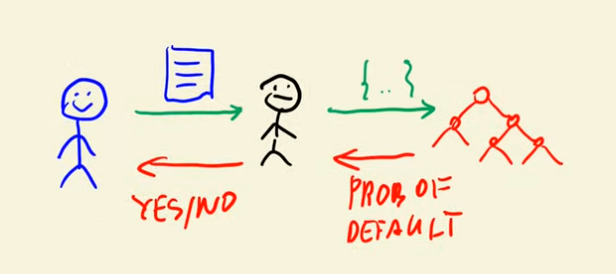

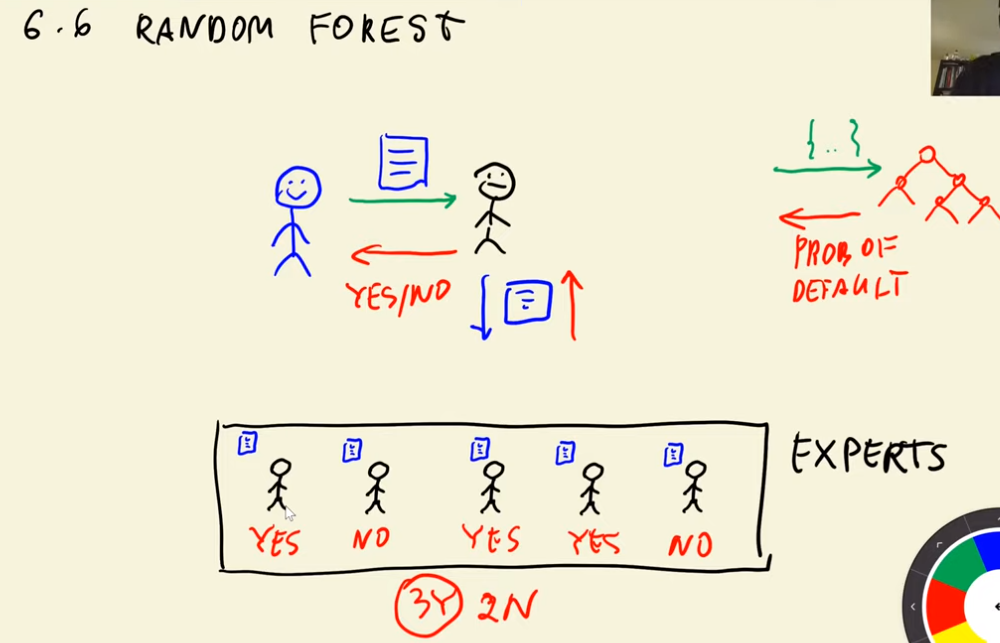

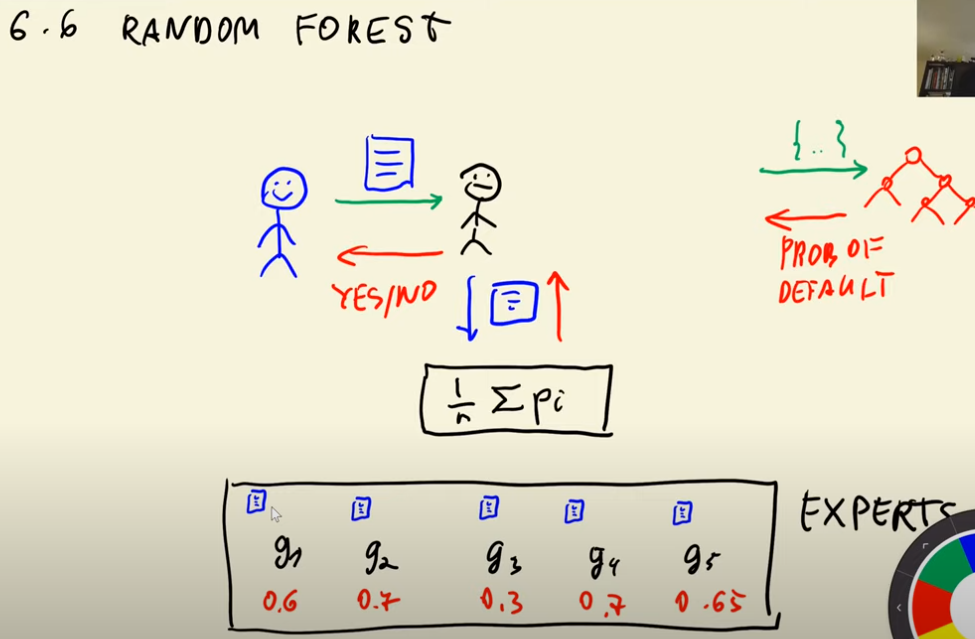

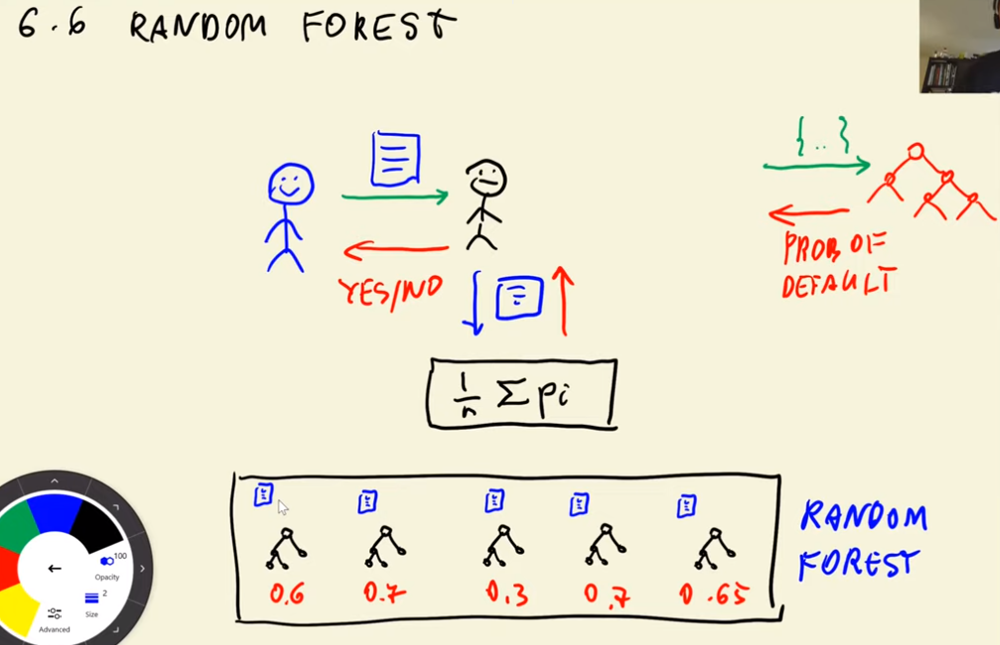



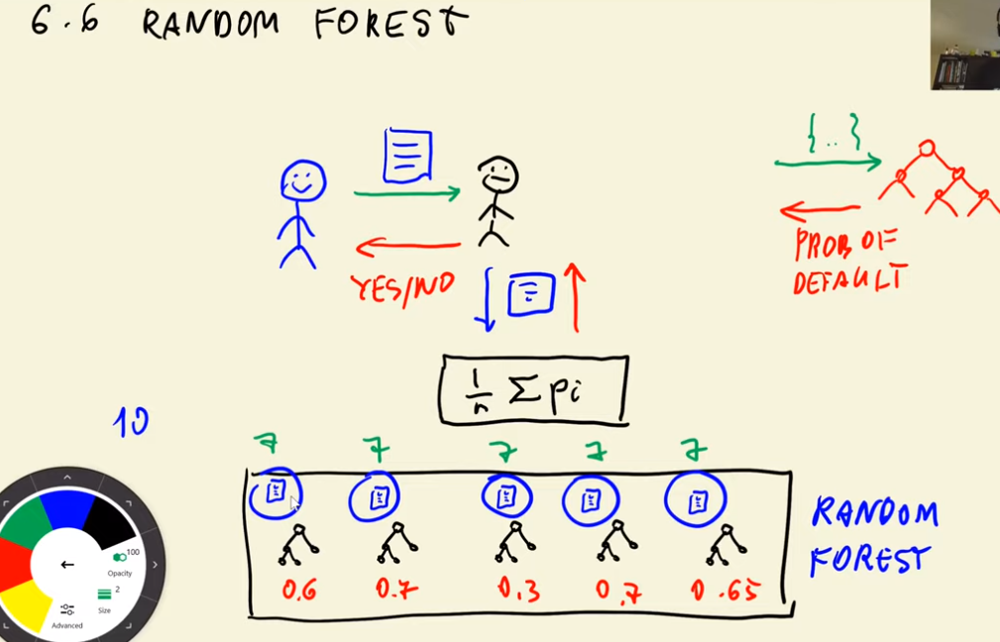

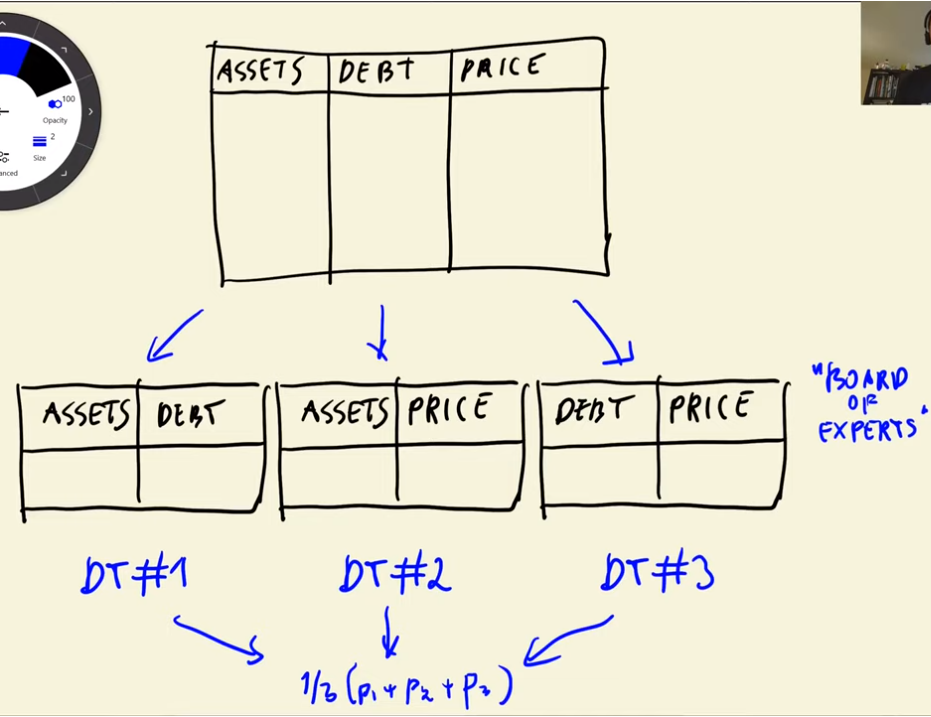

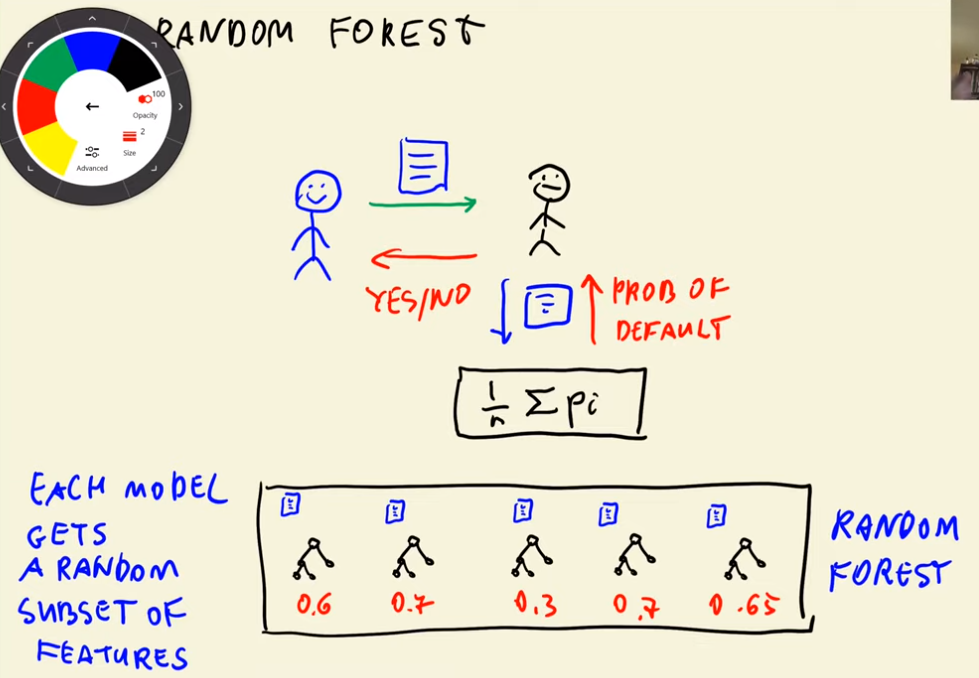

In [317]:
from sklearn.ensemble import RandomForestClassifier

In [318]:
rf = RandomForestClassifier(n_estimators=10)
rf.fit(X_train, y_train)

y_pred = rf.predict_proba(X_val)[:, 1]
roc_auc_score(y_val, y_pred)

0.7801276307185585

In [319]:
rf.predict_proba(X_val)[0]  # random olduğundan dolayı random_state=1 kullanılmadığında modeli her çalıştırmada farklı sonuç gelecektir.

array([0.8, 0.2])

In [320]:
# n_estimators

scores = []

for n in range(10, 201, 10):
    rf = RandomForestClassifier(n_estimators=n, random_state=1)
    rf.fit(X_train, y_train)

    y_pred = rf.predict_proba(X_val)[:, 1]
    auc = roc_auc_score(y_val, y_pred)
    
    scores.append((n, auc))

In [321]:
df_scores = pd.DataFrame(scores, columns=['n_estimators', 'auc'])
df_scores

,n_estimators,auc
0,10,0.774473
1,20,0.803532
2,30,0.815075
3,40,0.815686
4,50,0.817082
5,60,0.816458
6,70,0.817321
7,80,0.816307
8,90,0.816824
9,100,0.817599


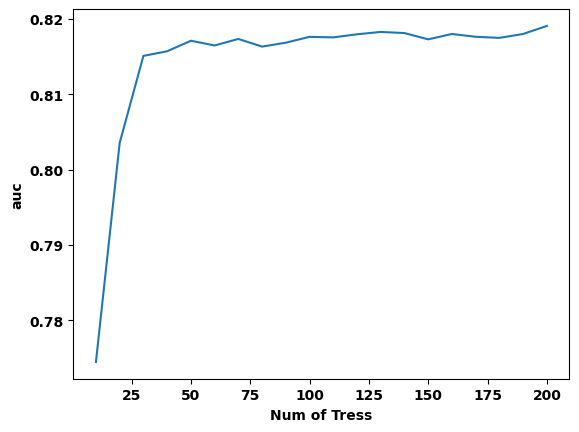

In [322]:
plt.plot(df_scores.n_estimators, df_scores.auc)
plt.xlabel('Num of Tress')
plt.ylabel('auc');

In [323]:
# n_estimators and max_depth

scores = []

for d in [5, 10, 15]:
    for n in range(10, 201, 10):
        rf = RandomForestClassifier(n_estimators=n,
                                    max_depth=d,
                                    random_state=1)
        rf.fit(X_train, y_train)

        y_pred = rf.predict_proba(X_val)[:, 1]
        auc = roc_auc_score(y_val, y_pred)

        scores.append((d, n, auc))

In [324]:
columns = ['max_depth', 'n_estimators', 'auc']
df_scores = pd.DataFrame(scores, columns=columns)

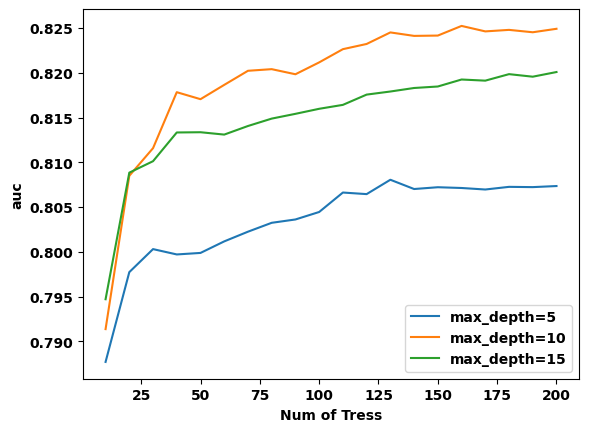

In [325]:
for d in [5, 10, 15]:
    df_subset = df_scores[df_scores.max_depth == d]
    
    plt.plot(df_subset.n_estimators, df_subset.auc,
             label='max_depth=%d' % d)
    plt.xlabel('Num of Tress')
    plt.ylabel('auc')
    plt.legend();

In [326]:
# best max_depth

max_depth = 10

In [327]:
# with best max_depth=10
# n_estimators and min_samples_leaf

scores = []

for s in [1, 3, 5, 10, 50]:
    for n in range(10, 201, 10):
        rf = RandomForestClassifier(n_estimators=n,
                                    max_depth=max_depth,
                                    min_samples_leaf=s,
                                    random_state=1)
        rf.fit(X_train, y_train)

        y_pred = rf.predict_proba(X_val)[:, 1]
        auc = roc_auc_score(y_val, y_pred)

        scores.append((s, n, auc))

In [328]:
columns = ['min_samples_leaf', 'n_estimators', 'auc']
df_scores = pd.DataFrame(scores, columns=columns)
df_scores

,min_samples_leaf,n_estimators,auc
0,1,10,0.791365
1,1,20,0.808496
2,1,30,0.811584
3,1,40,0.817839
4,1,50,0.817058
...,...,...,...
95,50,160,0.805929
96,50,170,0.805172
97,50,180,0.805324
98,50,190,0.805596


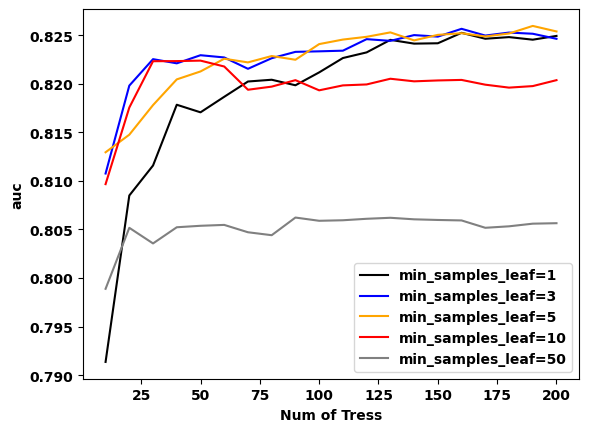

In [329]:
colors = ['black', 'blue', 'orange', 'red', 'grey']
values = [1, 3, 5, 10, 50]

for s, col in zip(values, colors):
    df_subset = df_scores[df_scores.min_samples_leaf == s]
    
    plt.plot(df_subset.n_estimators, df_subset.auc,
             color=col,
             label='min_samples_leaf=%d' % s)
    plt.xlabel('Num of Tress')
    plt.ylabel('auc')
    plt.legend();

In [330]:
# best min_samples_leaf

min_samples_leaf = 3

In [331]:
# train with best parameter values as a final model

rf = RandomForestClassifier(n_estimators=200,
                            max_depth=max_depth,
                            min_samples_leaf=min_samples_leaf,
                            random_state=1)
rf.fit(X_train, y_train)

RandomForestClassifier(max_depth=10, min_samples_leaf=3, n_estimators=200,
                       random_state=1)

In [332]:
y_pred = rf.predict_proba(X_val)[:, 1]
roc_auc_score(y_val, y_pred)

0.8246258264512848

Other useful parametes:

* `max_features`
* `bootstrap`

https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html

## 6.7 Gradient boosting and XGBoost

* Gradient boosting vs random forest
* Installing XGBoost
* Training the first model
* Performance monitoring
* Parsing xgboost's monitoring output

Unlike Random Forest where each decision tree trains independently, in the Gradient Boosting Trees, the models are combined sequentially where each model takes the prediction errors made my the previous model and then tries to improve the prediction. This process continues to ``n`` number of iterations and in the end all the predictions get combined to make final prediction.

XGBoost is one of the libraries which implements the gradient boosting technique. To make use of the library, we need to install with ``pip install xgboost``. To train and evaluate the model, we need to wrap our train and validation data into a special data structure from XGBoost which is called ``DMatrix``. This data structure is optimized to train xgboost models faster.

**Classes, functions, and methods**:

- ``xgb.train()``: method to train xgboost model.
- ``xgb_params``: key-value pairs of hyperparameters to train xgboost model.
- ``watchlist``: list to store training and validation accuracy to evaluate the performance of the model after each training - iteration. The list takes tuple of train and validation set from DMatrix wrapper, for example, ``watchlist = [(dtrain, 'train'), (dval, 'val')]``.
- ``%%capture output``: IPython magic command which captures the standard output and standard error of a cell.

**Extracting results from ``xgb.train(..)``**

In the video we use jupyter magic command ``%%capture output`` to extract the output of ``xgb.train(..)`` method.

Alternatively you can use the ``evals_result`` parameter of the ``xgb.train(..)``. You can pass an empty dictionary in for this parameter and the train() method will populate it with the results. The result will be of type ``OrderedDict`` so we have to transform it to a dataframe. For this, ``zip()`` can help. Here's an example code snippet:

**Installing XGBoost on Mac**

Some students reported problems with installing XGBoost on Mac.

When you run ``pip install xgboost`` and when you try to ``import xgboost`` in a script you might get an warning or error stating that libomp has not been installed and to run ``brew install libomp`` in the terminal.

Be careful: this will install a version of libomp that does not work with ``xgboost``!

This shows in one of two ways after attempting to run ``xgb.DMatrix(X_train, label=y_train, feature_names=features)``:

- **python script**: Segmentation fault: 11
- **jupyter notebook**: Never finished running, and notebook is unresponsive until kernal restart. However confusingly it sometimes works

**Conda**

If you use anaconda or miniconda, try installing xgboost with conda.

First, uninstall xgboost with pip (if you already installed it previously with pip):

    pip uninstall xgboost

Then re-install it with conda:

    conda install -c conda-forge xgboost 
    
It will also install the required version of libomp.

**Without conda**

If you don't use conda, you can manualy install a different version of libopm that works well with XGBoost.

The versions of libomp with this problem are 12.x.x and 13.x.x, however issue has a workaround [xgboost issue #7039](https://github.com/dmlc/xgboost/issues/7039) installing the older libomp 11 using the terminal. In the terminal run ``brew list --version libomp``, to determine the current version of libomp if any. Then if you have a problematic version run ``brew unlink libomp``.

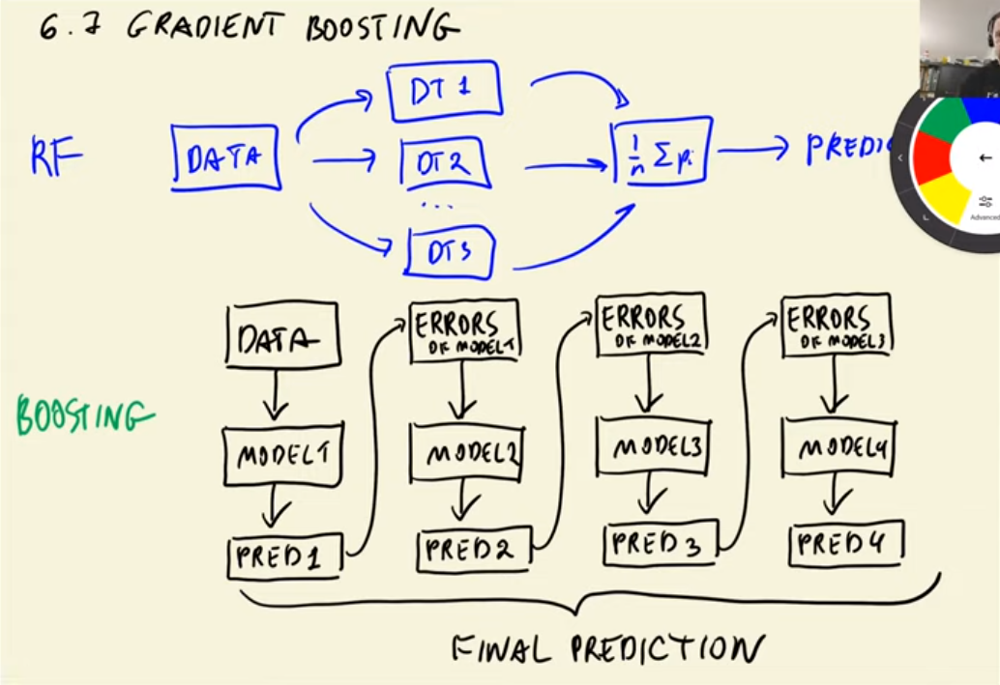

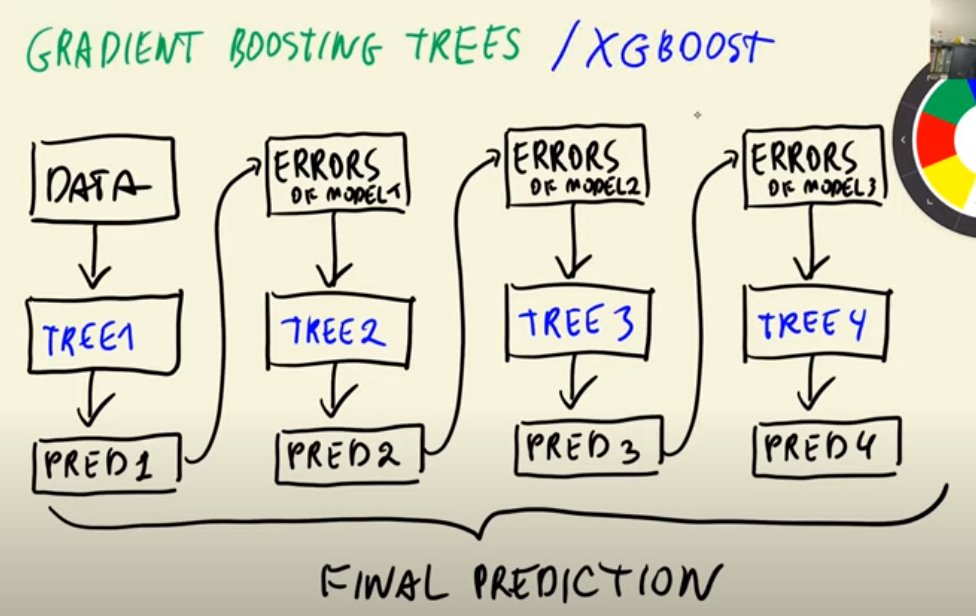

In [333]:
# !pip install xgboost

[XGBoost Documentation](https://xgboost.readthedocs.io/en/stable/)

In [334]:
import xgboost as xgb

In [335]:
features = dv.get_feature_names_out()
dtrain = xgb.DMatrix(X_train, label=y_train, feature_names=features)
dval = xgb.DMatrix(X_val, label=y_val, feature_names=features)

In [336]:
xgb_params = {
    'eta': 0.3, 
    'max_depth': 6,
    'min_child_weight': 1,
    
    'objective': 'binary:logistic',
    'nthread': 8,
    
    'seed': 1,
    'verbosity': 1,
}

model = xgb.train(xgb_params, dtrain, num_boost_round=10)

In [337]:
y_pred = model.predict(dval)

In [338]:
roc_auc_score(y_val, y_pred)

0.8152745150274878

In [339]:
watchlist = [(dtrain, 'train'), (dval, 'val')]
# watchlist

In [340]:
%%capture output

xgb_params = {
    'eta': 0.3, 
    'max_depth': 6,
    'min_child_weight': 1,
    
    'objective': 'binary:logistic',
    'eval_metric': 'auc',

    'nthread': 8,
    'seed': 1,
    'verbosity': 1,
}

model = xgb.train(xgb_params, dtrain, num_boost_round=200,
                  verbose_eval=5,
                  evals=watchlist)

In [341]:
s = output.stdout

In [342]:
print(s[:200])

[0]	train-auc:0.86300	val-auc:0.76818
[5]	train-auc:0.92863	val-auc:0.80606
[10]	train-auc:0.95002	val-auc:0.81558
[15]	train-auc:0.96558	val-auc:0.81680
[20]	train-auc:0.97316	val-auc:0.81775
[25]	tr


In [343]:
def parse_xgb_output(output):
    results = []

    for line in output.stdout.strip().split('\n'):
        it_line, train_line, val_line = line.split('\t')

        it = int(it_line.strip('[]'))
        train = float(train_line.split(':')[1])
        val = float(val_line.split(':')[1])

        results.append((it, train, val))
    
    columns = ['num_iter', 'train_auc', 'val_auc']
    df_results = pd.DataFrame(results, columns=columns)
    return df_results

In [344]:
df_score = parse_xgb_output(output)
df_score

,num_iter,train_auc,val_auc
0,0,0.86300,0.76818
1,5,0.92863,0.80606
2,10,0.95002,0.81558
3,15,0.96558,0.81680
4,20,0.97316,0.81775
5,25,0.98174,0.81878
6,30,0.98772,0.81787
7,35,0.99180,0.81510
8,40,0.99456,0.81387
9,45,0.99596,0.81462


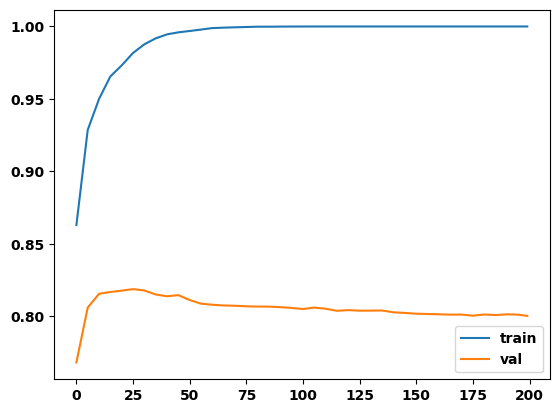

In [345]:
plt.plot(df_score.num_iter, df_score.train_auc, label='train')
plt.plot(df_score.num_iter, df_score.val_auc, label='val')
plt.legend();

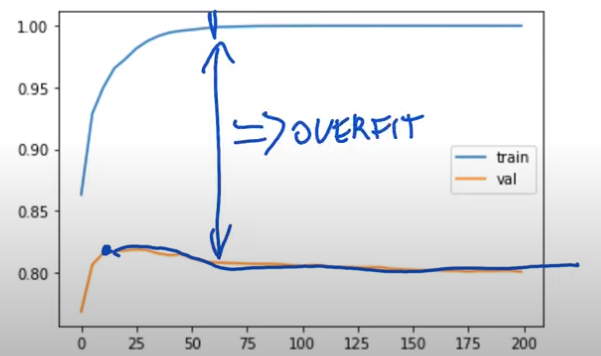

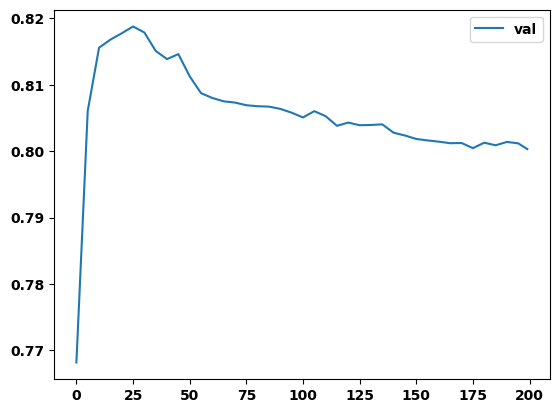

In [346]:
plt.plot(df_score.num_iter, df_score.val_auc, label='val')
plt.legend();

## 6.8 XGBoost parameter tuning

Tuning the following parameters:

* `eta`
* `max_depth`
* `min_child_weight`

XGBoost has various tunable parameters but the three most important ones are:

- ``eta`` (default=0.3)
    - It is also called ``learning_rate`` and is used to prevent overfitting by regularizing the weights of new features in each boosting step. range: [0, 1]
- ``max_depth`` (default=6)
    - Maximum depth of a tree. Increasing this value will make the model mroe complex and more likely to overfit. range: [0, inf]
- ``min_child_weight`` (default=1)
    - Minimum number of samples in leaf node. range: [0, inf]

For XGBoost models, there are other ways of finding the best parameters as well but the one we implement in the notebook follows the sequence of:

- First find the best value for ``eta``
- Second, find the best value for ``max_depth``
- Third, find the best value for ``min_child_weight``

Other useful parameter are:

- ``subsample`` (default=1)
    - Subsample ratio of the training instances. Setting it to 0.5 means that model would randomly sample half of the trianing data prior to growing trees. range: (0, 1]
- ``colsample_bytree`` (default=1)
    - This is similar to random forest, where each tree is made with the subset of randomly choosen features.
- ``lambda`` (default=1)
    - Also called ``reg_lambda``. L2 regularization term on weights. Increasing this value will make model more conservative.
- ``alpha`` (default=0)
    - Also called ``reg_alpha``. L1 regularization term on weights. Increasing this value will make model more conservative.

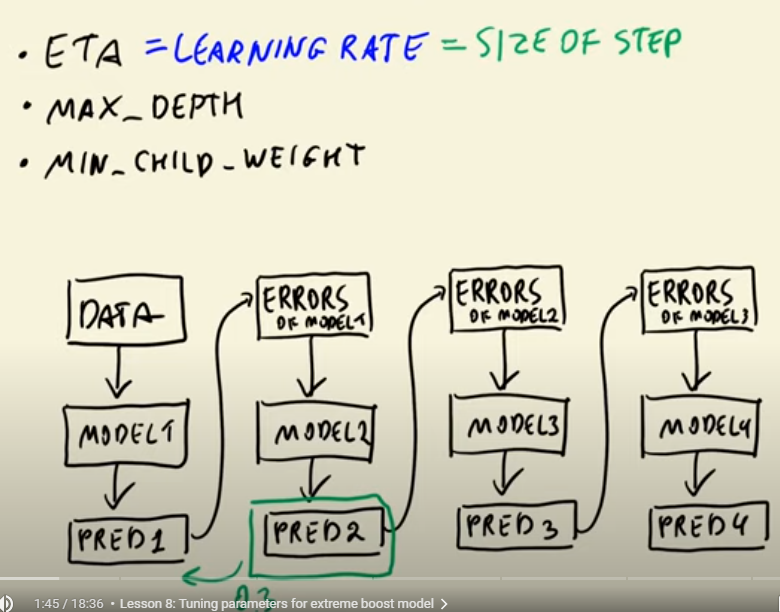

**eta**

In [347]:
scores = {}

Try for different eta values --> 'eta=0.01', 'eta=0.05', 'eta=0.1', 'eta=0.3', 'eta=1.0'

In [385]:
%%capture output

xgb_params = {
    'eta': 1.0, 
    'max_depth': 6,
    'min_child_weight': 1,
    
    'objective': 'binary:logistic',
    'eval_metric': 'auc',

    'nthread': 8,
    'seed': 1,
    'verbosity': 1,
}

model = xgb.train(xgb_params, dtrain, num_boost_round=200,
                  verbose_eval=5,
                  evals=watchlist)

In [386]:
'eta=%s' % (xgb_params['eta'])

'eta=1.0'

In [387]:
key = 'eta=%s' % (xgb_params['eta'])
scores[key] = parse_xgb_output(output)
key

'eta=1.0'

In [388]:
scores

{'eta=0.01':     num_iter  train_auc  val_auc
 0          0    0.86300  0.76818
 1          5    0.86420  0.77014
 2         10    0.87041  0.77142
 3         15    0.87302  0.77050
 4         20    0.87541  0.77526
 5         25    0.87859  0.77861
 6         30    0.88162  0.78368
 7         35    0.88289  0.78552
 8         40    0.88649  0.79003
 9         45    0.88971  0.79432
 10        50    0.89299  0.79684
 11        55    0.89726  0.79966
 12        60    0.90034  0.80122
 13        65    0.90225  0.80060
 14        70    0.90369  0.79970
 15        75    0.90577  0.80068
 16        80    0.90732  0.80142
 17        85    0.90891  0.80142
 18        90    0.91069  0.80236
 19        95    0.91234  0.80296
 20       100    0.91428  0.80422
 21       105    0.91621  0.80495
 22       110    0.91759  0.80570
 23       115    0.91896  0.80647
 24       120    0.92010  0.80677
 25       125    0.92115  0.80691
 26       130    0.92232  0.80670
 27       135    0.92363  0.80688
 2

In [389]:
scores['eta=0.01']

,num_iter,train_auc,val_auc
0,0,0.86300,0.76818
1,5,0.86420,0.77014
2,10,0.87041,0.77142
3,15,0.87302,0.77050
4,20,0.87541,0.77526
5,25,0.87859,0.77861
6,30,0.88162,0.78368
7,35,0.88289,0.78552
8,40,0.88649,0.79003
9,45,0.88971,0.79432


In [390]:
scores

{'eta=0.01':     num_iter  train_auc  val_auc
 0          0    0.86300  0.76818
 1          5    0.86420  0.77014
 2         10    0.87041  0.77142
 3         15    0.87302  0.77050
 4         20    0.87541  0.77526
 5         25    0.87859  0.77861
 6         30    0.88162  0.78368
 7         35    0.88289  0.78552
 8         40    0.88649  0.79003
 9         45    0.88971  0.79432
 10        50    0.89299  0.79684
 11        55    0.89726  0.79966
 12        60    0.90034  0.80122
 13        65    0.90225  0.80060
 14        70    0.90369  0.79970
 15        75    0.90577  0.80068
 16        80    0.90732  0.80142
 17        85    0.90891  0.80142
 18        90    0.91069  0.80236
 19        95    0.91234  0.80296
 20       100    0.91428  0.80422
 21       105    0.91621  0.80495
 22       110    0.91759  0.80570
 23       115    0.91896  0.80647
 24       120    0.92010  0.80677
 25       125    0.92115  0.80691
 26       130    0.92232  0.80670
 27       135    0.92363  0.80688
 2

In [391]:
scores.keys()

dict_keys(['eta=0.01', 'eta=0.05', 'eta=0.1', 'eta=0.3', 'eta=1.0'])

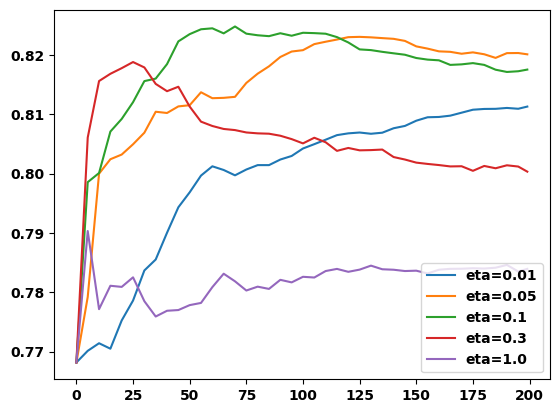

In [392]:
for key, df_score in scores.items() :
    plt.plot(df_score.num_iter, df_score.val_auc, label=key)
    plt.legend();

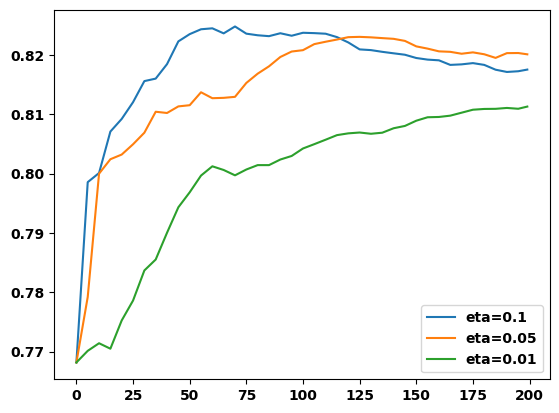

In [393]:
etas = ['eta=0.1', 'eta=0.05', 'eta=0.01']

for eta in etas :
    df_score = scores[eta]
    plt.plot(df_score.num_iter, df_score.val_auc, label=eta)
    plt.legend()

Best eta value --> 0.1

**max_depth**

In [400]:
scores = {}

Try for different max_depth values --> 'max_depth=3', 'max_depth=4', 'max_depth=6', 'max_depth=10'

In [426]:
%%capture output

xgb_params = {
    'eta': 0.1, 
    'max_depth': 10,
    'min_child_weight': 1,
    
    'objective': 'binary:logistic',
    'eval_metric': 'auc',

    'nthread': 8,
    'seed': 1,
    'verbosity': 1,
}

model = xgb.train(xgb_params, dtrain, num_boost_round=200,
                  verbose_eval=5,
                  evals=watchlist)

In [427]:
'max_depth=%s' % (xgb_params['max_depth'])

'max_depth=10'

In [428]:
key = 'max_depth=%s' % (xgb_params['max_depth'])
scores[key] = parse_xgb_output(output)
key

'max_depth=10'

In [429]:
scores

{'max_depth=3':     num_iter  train_auc  val_auc
 0          0    0.77424  0.73571
 1          5    0.83122  0.77763
 2         10    0.84733  0.78964
 3         15    0.85566  0.80035
 4         20    0.86359  0.80617
 5         25    0.87161  0.81051
 6         30    0.87855  0.81478
 7         35    0.88298  0.81792
 8         40    0.88701  0.81990
 9         45    0.89137  0.82277
 10        50    0.89458  0.82595
 11        55    0.89884  0.82716
 12        60    0.90159  0.82806
 13        65    0.90380  0.82759
 14        70    0.90650  0.82801
 15        75    0.90935  0.82795
 16        80    0.91110  0.82940
 17        85    0.91298  0.82980
 18        90    0.91428  0.82997
 19        95    0.91655  0.83090
 20       100    0.91801  0.83221
 21       105    0.91981  0.83226
 22       110    0.92205  0.83290
 23       115    0.92301  0.83272
 24       120    0.92460  0.83285
 25       125    0.92615  0.83333
 26       130    0.92843  0.83414
 27       135    0.92942  0.83483

In [430]:
scores.keys()

dict_keys(['max_depth=3', 'max_depth=4', 'max_depth=6', 'max_depth=10'])

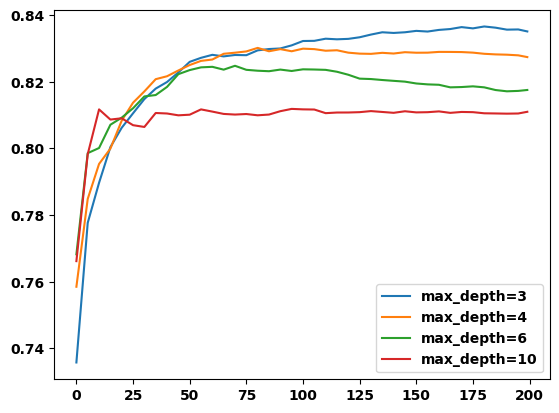

In [431]:
for key, df_score in scores.items() :
    plt.plot(df_score.num_iter, df_score.val_auc, label=key)
    plt.legend();

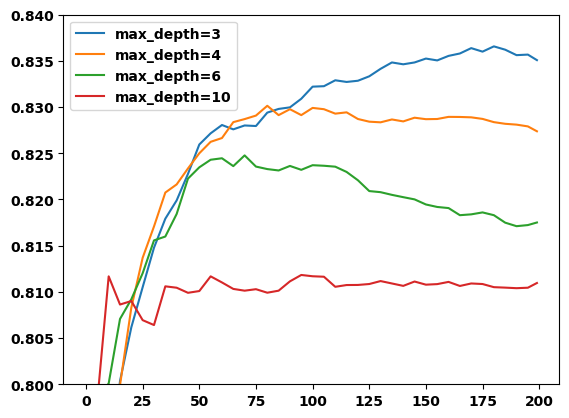

In [433]:
for max_depth, df_score in scores.items():
    plt.plot(df_score.num_iter, df_score.val_auc, label=max_depth)

plt.ylim(0.8, 0.84)
plt.legend()

In [434]:
del scores['max_depth=10']

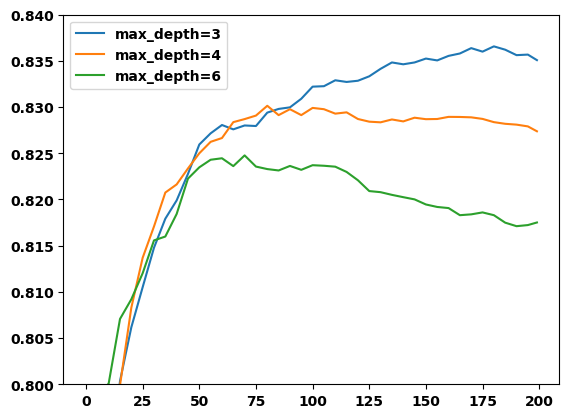

In [435]:
for max_depth, df_score in scores.items():
    plt.plot(df_score.num_iter, df_score.val_auc, label=max_depth)

plt.ylim(0.8, 0.84)
plt.legend()

Best max_depth value --> 3

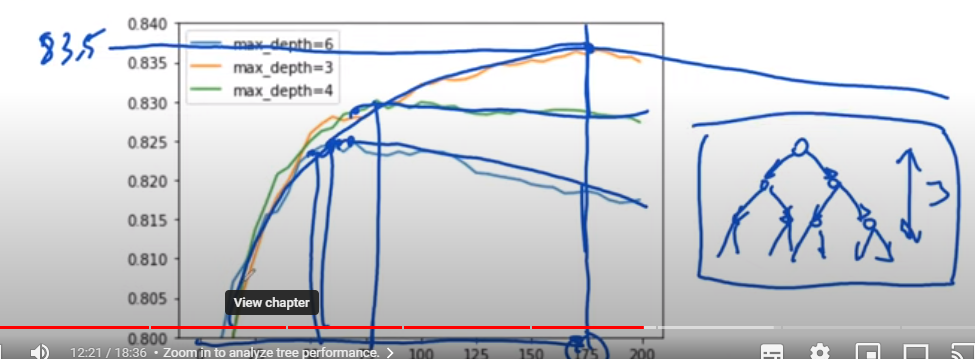

**min_child_weight**

In [436]:
scores = {}

Try for different min_child_weight values --> 'min_child_weight=1', 'min_child_weight=10', 'min_child_weight=30'

In [452]:
%%capture output

xgb_params = {
    'eta': 0.1, 
    'max_depth': 3,
    'min_child_weight': 30,
    
    'objective': 'binary:logistic',
    'eval_metric': 'auc',

    'nthread': 8,
    'seed': 1,
    'verbosity': 1,
}

model = xgb.train(xgb_params, dtrain, num_boost_round=200,
                  verbose_eval=5,
                  evals=watchlist)

In [453]:
'min_child_weight=%s' % (xgb_params['min_child_weight'])

'min_child_weight=30'

In [454]:
key = 'min_child_weight=%s' % (xgb_params['min_child_weight'])
scores[key] = parse_xgb_output(output)
key

'min_child_weight=30'

In [455]:
scores

{'min_child_weight=1':     num_iter  train_auc  val_auc
 0          0    0.77424  0.73571
 1          5    0.83122  0.77763
 2         10    0.84733  0.78964
 3         15    0.85566  0.80035
 4         20    0.86359  0.80617
 5         25    0.87161  0.81051
 6         30    0.87855  0.81478
 7         35    0.88298  0.81792
 8         40    0.88701  0.81990
 9         45    0.89137  0.82277
 10        50    0.89458  0.82595
 11        55    0.89884  0.82716
 12        60    0.90159  0.82806
 13        65    0.90380  0.82759
 14        70    0.90650  0.82801
 15        75    0.90935  0.82795
 16        80    0.91110  0.82940
 17        85    0.91298  0.82980
 18        90    0.91428  0.82997
 19        95    0.91655  0.83090
 20       100    0.91801  0.83221
 21       105    0.91981  0.83226
 22       110    0.92205  0.83290
 23       115    0.92301  0.83272
 24       120    0.92460  0.83285
 25       125    0.92615  0.83333
 26       130    0.92843  0.83414
 27       135    0.92942  

In [456]:
scores.keys()

dict_keys(['min_child_weight=1', 'min_child_weight=10', 'min_child_weight=30'])

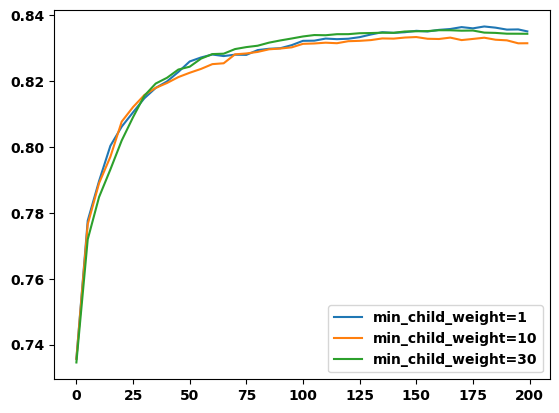

In [457]:
for min_child_weight, df_score in scores.items():
    plt.plot(df_score.num_iter, df_score.val_auc, label=min_child_weight)   
    plt.legend()

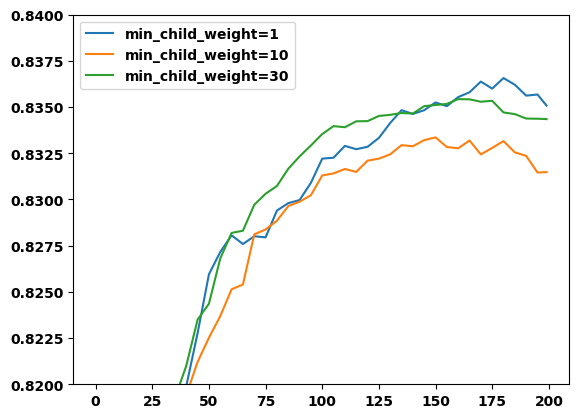

In [458]:
for min_child_weight, df_score in scores.items():
    plt.plot(df_score.num_iter, df_score.val_auc, label=min_child_weight)
    plt.ylim(0.82, 0.84)
    plt.legend()

Best min_child_weight value --> 1

**Final model with best parameters**

In [459]:
xgb_params = {
    'eta': 0.1, 
    'max_depth': 3,
    'min_child_weight': 1,

    'objective': 'binary:logistic',
    'eval_metric': 'auc',

    'nthread': 8,
    'seed': 1,
    'verbosity': 1,
}

model = xgb.train(xgb_params, dtrain, num_boost_round=175)

Other parameters: https://xgboost.readthedocs.io/en/latest/parameter.html

Useful ones:

* `subsample` and `colsample_bytree`
* `lambda` and `alpha`

## 6.9 Selecting the final model

* Choosing between xgboost, random forest and decision tree
* Training the final model
* Saving the model

We select the final model from decision tree, random forest, or xgboost based on the best auc scores. After that we prepare the ``df_full_train`` and ``df_test`` to train and evaluate the final model. If there is not much difference between model auc scores on the train as well as test data then the model has generalized the patterns well enough.

Generally, XGBoost models perform better on tabular data than other machine learning models but the downside is that these model are easy to overfit cause of the high number of hyperparameter. Therefore, XGBoost models require a lot more attention for parameters tuning to optimize them.

In [461]:
# Decision Tree model with best parameters

dt = DecisionTreeClassifier(max_depth=6, min_samples_leaf=15)
dt.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=6, min_samples_leaf=15)

In [462]:
y_pred = dt.predict_proba(X_val)[:, 1]
roc_auc_score(y_val, y_pred)

0.785470804775859

In [463]:
# Random Forest model with best parameters

rf = RandomForestClassifier(n_estimators=200,
                            max_depth=10,
                            min_samples_leaf=3,
                            random_state=1)
rf.fit(X_train, y_train)

RandomForestClassifier(max_depth=10, min_samples_leaf=3, n_estimators=200,
                       random_state=1)

In [464]:
y_pred = rf.predict_proba(X_val)[:, 1]
roc_auc_score(y_val, y_pred)

0.8246258264512848

In [465]:
# XGBoost model with best parameters

xgb_params = {
    'eta': 0.1, 
    'max_depth': 3,
    'min_child_weight': 1,

    'objective': 'binary:logistic',
    'eval_metric': 'auc',

    'nthread': 8,
    'seed': 1,
    'verbosity': 1,
}

model = xgb.train(xgb_params, dtrain, num_boost_round=175)

In [466]:
y_pred = model.predict(dval)
roc_auc_score(y_val, y_pred)

0.8360387251459157

In [467]:
df_full_train = df_full_train.reset_index(drop=True)

In [468]:
y_full_train = (df_full_train.status == 'default').astype(int).values

In [469]:
del df_full_train['status']

In [470]:
dicts_full_train = df_full_train.to_dict(orient='records')

dv = DictVectorizer(sparse=False)
X_full_train = dv.fit_transform(dicts_full_train)

dicts_test = df_test.to_dict(orient='records')
X_test = dv.transform(dicts_test)

In [471]:
dfulltrain = xgb.DMatrix(X_full_train, label=y_full_train,
                    feature_names=dv.get_feature_names_out())

dtest = xgb.DMatrix(X_test, feature_names=dv.get_feature_names_out())

In [472]:
# Final Model with XGBoost

xgb_params = {
    'eta': 0.1, 
    'max_depth': 3,
    'min_child_weight': 1,

    'objective': 'binary:logistic',
    'eval_metric': 'auc',

    'nthread': 8,
    'seed': 1,
    'verbosity': 1,
}

model = xgb.train(xgb_params, dfulltrain, num_boost_round=175)

In [473]:
y_pred = model.predict(dtest)

In [474]:
roc_auc_score(y_test, y_pred)

0.8322662626460096

## 6.10 Summary

* Decision trees learn if-then-else rules from data.
* Finding the best split: select the least impure split. This algorithm can overfit, that's why we control it by limiting the max depth and the size of the group.
* Random forest is a way of combininig multiple decision trees. It should have a diverse set of models to make good predictions.
* Gradient boosting trains model sequentially: each model tries to fix errors of the previous model. XGBoost is an implementation of gradient boosting. 

## 6.11 Explore more

* For this dataset we didn't do EDA or feature engineering. You can do it to get more insights into the problem.
* For random forest, there are more parameters that we can tune. Check `max_features` and `bootstrap`.
* There's a variation of random forest caled "extremely randomized trees", or "extra trees". Instead of selecting the best split among all possible thresholds, it selects a few thresholds randomly and picks the best one among them. Because of that extra trees never overfit. In Scikit-Learn, they are implemented in `ExtraTreesClassifier`. Try it for this project.
* XGBoost can deal with NAs - we don't have to do `fillna` for it. Check if not filling NA's help improve performance.
* Experiment with other XGBoost parameters: `subsample` and `colsample_bytree`.
* When selecting the best split, decision trees find the most useful features. This information can be used for understanding which features are more important than otheres. See example here for [random forest](https://scikit-learn.org/stable/auto_examples/ensemble/plot_forest_importances.html) (it's the same for plain decision trees) and for [xgboost](https://stackoverflow.com/questions/37627923/how-to-get-feature-importance-in-xgboost)
* Trees can also be used for solving the regression problems: check `DecisionTreeRegressor`, `RandomForestRegressor` and the `objective=reg:squarederror` parameter for XGBoost.